## Detection of Frontal Eddies Manually

In [1]:
import numpy as np
import xarray as xr
import os.path as op
from matplotlib import colors, ticker
import matplotlib.pyplot as plt
%matplotlib inline

from datetime import date, timedelta, datetime
import cartopy.crs as crs
import hvplot.xarray

Algorithm Steps

0. filter to my area of interest just based on SAB and beyond
1. find the local minima in the image or maybe just find neighborhoods of negative  
2. when tracking just find the center of a negative blob and ensure it is within a couple pixels of the previous location of that blob
3. profit

This is based on https://py-eddy-tracker.readthedocs.io/en/latest/installation.html

In [378]:
ds_ssh = xr.open_dataset('aviso/dataset-duacs-rep-global-merged-allsat-phy-l4_1603205725460.nc')
ds_ssh

<xarray.Dataset>
Dimensions:    (latitude: 63, longitude: 328, time: 1749)
Coordinates:
  * time       (time) datetime64[ns] 2015-01-01 2015-01-02 ... 2019-10-15
  * latitude   (latitude) float32 26.125 26.375 26.625 ... 41.125 41.375 41.625
  * longitude  (longitude) float32 278.125 278.375 278.625 ... 359.625 359.875
Data variables:
    adt        (time, latitude, longitude) float64 ...
    err        (time, latitude, longitude) float64 ...
    sla        (time, latitude, longitude) float64 ...
Attributes:
    Conventions:                     CF-1.6
    Metadata_Conventions:            Unidata Dataset Discovery v1.0
    cdm_data_type:                   Grid
    comment:                         Sea Surface Height measured by Altimetry...
    contact:                         servicedesk.cmems@mercator-ocean.eu
    creator_email:                   servicedesk.cmems@mercator-ocean.eu
    creator_name:                    CMEMS - Sea Level Thematic Assembly Center
    creator_url:                     http://marine.copernicus.eu
    date_created:                    2020-03-13T10:01:53Z
    date_issued:                     2020-03-13T10:01:53Z
    date_modified:                   2020-03-13T10:01:53Z
    geospatial_lat_max:              41.625
    geospatial_lat_min:              26.125
    geospatial_lat_resolution:       0.25
    geospatial_lat_units:            degrees_north
    geospatial_lon_max:              -0.125
    geospatial_lon_min:              -81.875
    geospatial_lon_resolution:       0.25
    geospatial_lon_units:            degrees_east
    geospatial_vertical_max:         0.0
    geospatial_vertical_min:         0.0
    geospatial_vertical_positive:    down
    geospatial_vertical_resolution:  point
    geospatial_vertical_units:       m
    history:                         2020-03-13 10:01:55Z: Creation
    institution:                     CLS, CNES
    keywords:                        Oceans > Ocean Topography > Sea Surface ...
    keywords_vocabulary:             NetCDF COARDS Climate and Forecast Stand...
    license:                         http://marine.copernicus.eu/web/27-servi...
    platform:                        Altika Drifting Phase, Cryosat-2, Haiyan...
    processing_level:                L4
    product_version:                 2020
    project:                         COPERNICUS MARINE ENVIRONMENT MONITORING...
    references:                      http://marine.copernicus.eu
    software_version:                6.3_DUACS_DT2018_baseline
    source:                          Altimetry measurements
    ssalto_duacs_comment:            The reference mission used for the altim...
    standard_name_vocabulary:        NetCDF Climate and Forecast (CF) Metadat...
    summary:                         SSALTO/DUACS Delayed-Time Level-4 sea su...
    time_coverage_duration:          P1D
    time_coverage_end:               2019-10-15T00:00:00Z
    time_coverage_resolution:        P1D
    time_coverage_start:             2019-10-15T00:00:00Z
    title:                           DT merged all satellites Global Ocean Gr...
    History:                         Translated to CF-1.0 Conventions by Netc...

In [379]:
ds_ssh = ds_ssh.sel(time=slice('2017-01-01', '2019-10-15'))
ds_ssh = ds_ssh.sel( latitude=slice(29, 36), longitude=slice(-85+360,-65+360))
ds_ssh = ds_ssh.rename({'longitude':'lon','latitude':'lat'})
ds_ssh['lon'] = ds_ssh['lon']-360

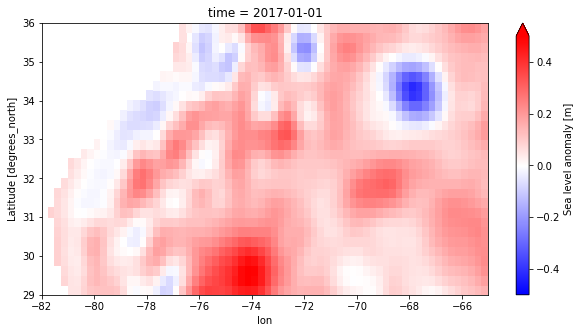

In [380]:
ds_ssh.sla[0].plot(vmin=-.5, vmax=.5, cmap='bwr', figsize=(10,5))

In [5]:
bathy = xr.open_dataset('bathymetry/GEBCO_2020_23_Oct_2020_c3e0a2c71e39/gebco_2020_n41.220703125_s24.7412109375_w-82.6611328125_e-59.765625.nc')
bathy_gs = bathy.sel( lat=slice(29, 36), lon=slice(-85,-65))

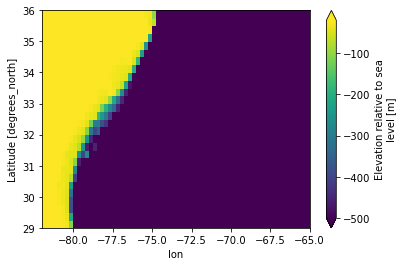

In [6]:
interp_bathy = bathy_gs.interp(lat=ds_ssh["lat"], lon=ds_ssh["lon"])
interp_bathy.elevation.plot(vmin=-500,vmax=-20)

In [381]:
ds_cropped = ds_ssh.copy()

In [382]:
ds_cropped['sla'] = ds_cropped.sla.where(interp_bathy.elevation < -50) 
ds_cropped['sla'] = ds_cropped.sla.where(interp_bathy.elevation > -2000) 

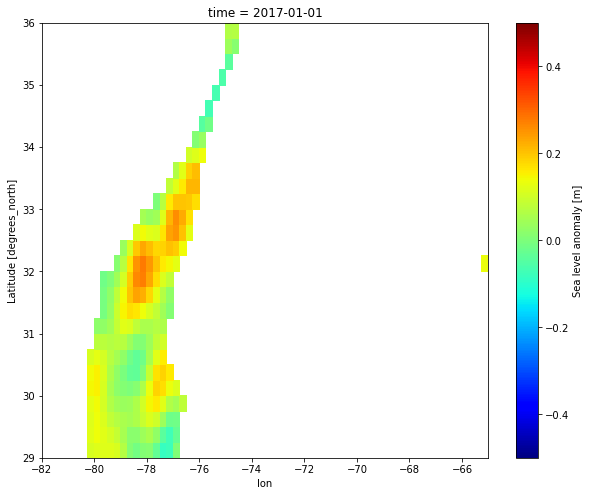

In [383]:
day = 0
ds_cropped.sla[day].plot(vmin=-.5, vmax=.5, cmap='jet', figsize=(10,8))

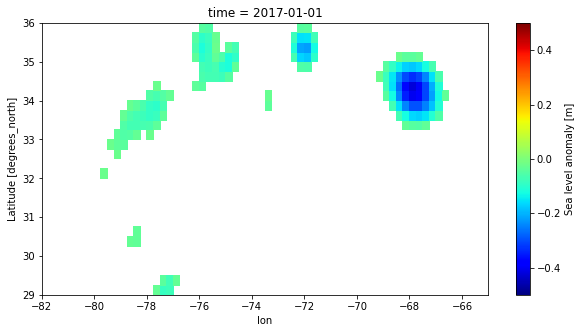

In [384]:
ds_ssh.sla.where(ds_ssh.sla[day] < -0.02)[day].plot(vmin=-.5, vmax=.5, cmap='jet', figsize=(10,5))

(array([ 5.,  9., 16., 19., 19., 20., 15., 13., 11., 17., 27., 23., 12.,
         5.,  9.]),
 array([-0.1173    , -0.08506667, -0.05283333, -0.0206    ,  0.01163333,
         0.04386667,  0.0761    ,  0.10833333,  0.14056667,  0.1728    ,
         0.20503333,  0.23726667,  0.2695    ,  0.30173333,  0.33396667,
         0.3662    ]),
 <BarContainer object of 15 artists>)

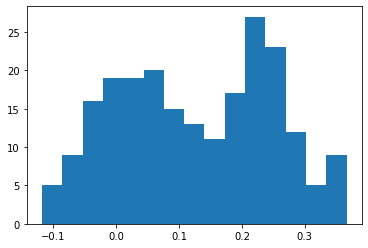

In [231]:
plt.hist(ds_cropped.sla[day].values.flatten(), bins=15)

In [232]:
import matplotlib.pyplot as plt

from skimage.measure import label
from skimage import data
from skimage import color
from skimage.morphology import extrema
from skimage import exposure

In [233]:
img = np.copy(ds_ssh.sla[day].values)

In [234]:
# We find all local maxima
local_maxima = extrema.local_minima(img)
label_maxima = label(local_maxima)
overlay = color.label2rgb(label_maxima, img, alpha=0.7, bg_label=0,
                          bg_color=None, colors=[(1, 0, 0)])

In [235]:
# h = 0.05
# h_maxima = extrema.h_maxima(img, h)
# label_h_maxima = label(h_maxima)
# overlay_h = color.label2rgb(label_h_maxima, img, alpha=0.7, bg_label=0,
#                             bg_color=None, colors=[(1, 0, 0)])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


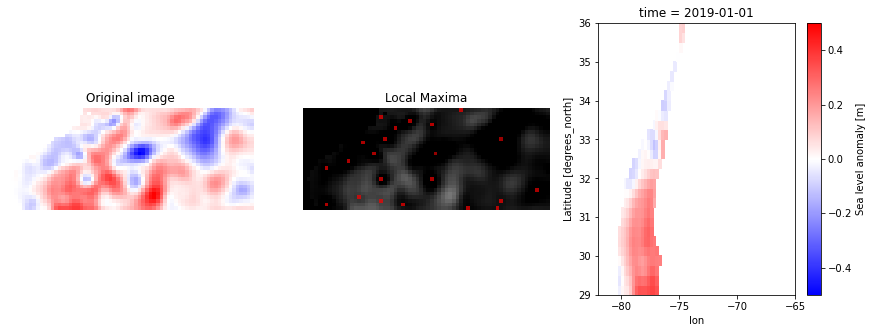

In [236]:
fig, ax = plt.subplots(1, 3, figsize=(15, 5))

ax[0].imshow(img, cmap='bwr')
ax[0].set_title('Original image')
ax[0].axis('off')
ax[0].set_ylim(ax[0].get_ylim()[::-1])

ax[1].imshow(overlay)
ax[1].set_title('Local Maxima')
ax[1].axis('off')
ax[1].set_ylim(ax[1].get_ylim()[::-1])


ds_cropped.sla[day].plot(ax=ax[2],vmin=-.5, vmax=.5, cmap='bwr')

In [237]:
ds_cropped.sla[day].values[local_maxima == True]

array([    nan,     nan,     nan,     nan,     nan,     nan,  0.1897,
           nan,     nan,     nan,     nan, -0.0845, -0.1173,     nan,
           nan, -0.0961,     nan, -0.0436,     nan,     nan,     nan,
           nan])

In [238]:
subset_minima = np.copy(local_maxima)

In [239]:
subset_minima[ds_ssh.sla[day].values > -0.02] = False

In [240]:
ds_ssh.sla[day].values[subset_minima == True]

array([-0.0571, -0.1115, -0.0625, -0.1081, -0.0201, -0.0845, -0.1173,
       -0.3921, -0.074 , -0.0961, -0.31  , -0.0436, -0.1423])

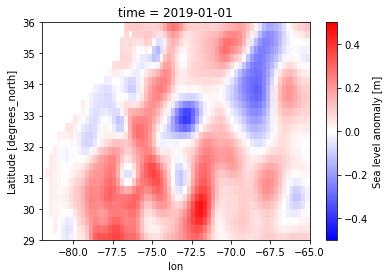

In [241]:
ds_ssh.sla[day].plot(vmin=-.5, vmax=.5, cmap='bwr')

(-0.5, 27.5)

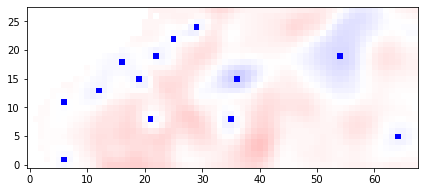

In [242]:
fig, ax = plt.subplots(figsize=(7, 7))

sla_array = np.copy(ds_ssh.sla[day].values)
sla_array[subset_minima == True] = -5
ax.imshow(sla_array, clim=(-2,2), cmap='bwr')
ax.set_ylim(ax.get_ylim()[::-1])

get locations of pixels where the cropped one isn't nan

In [243]:
r,c = np.where((subset_minima == True) & (ds_cropped.sla[day] < -0.05))
r,c

(array([13, 15, 19]), array([12, 19, 22]))

In [24]:
r = r[0]
c = c[0]

In [25]:
# r_1 = r[1]
# c_1 = c[1]

We now have some basic filtering process, if I take those points, basically lat/lon coords, and look at the neighborhood around it it should be negative all around it except for maybe one pix

In [26]:
(ds_ssh.sla[day].values[r-1:r+2,c-1:c+2]<0)

array([[ True,  True,  True],
       [ True,  True,  True],
       [ True,  True,  True]])

In [27]:
np.sum((ds_ssh.sla[day].values[r-1:r+2,c-1:c+2]<0)) > 6

True

### Identification Loop

pandas df with

eddy_id, date, center lat/lon

then run a tracking algorithm that iterates through each eddy detected that day and basically asks for eddies within the last 2-3 days that are within 2-3 pixels
if one already exists with that ID from the same date then choose the closer one
if one does not match those conditions then create a new ID

In [359]:
#sort by depth


pix_distance_for_same_eddy = 7

#eddy_coords = list(zip(*eddy_coords))

sla_values = []
for i, coords in enumerate(eddy_coords):
    r,c = coords
    sla_values.append(ds_cropped.sla.sel(time=dt)[r,c].values)

    
coords_and_depth = list(zip(eddy_coords, sla_values))

coords_depth_sorted = sorted(coords_and_depth,key=lambda x:(x[1],x[0]))
coords_depth_sorted

[((23, 17), array(-0.2197)),
 ((8, 18), array(-0.1168)),
 ((2, 18), array(-0.1145)),
 ((22, 12), array(-0.0928)),
 ((28, 21), array(-0.0666)),
 ((18, 8), array(-0.0527))]

In [367]:
#start with the deepest eddy and delete any within 7 pix, then the next deepest remaining and go from there

pix_distance_for_same_eddy = 7

eddy_coords = list(zip(*eddy_coords))

sla_values = []
for i, coords in enumerate(eddy_coords):
    r,c = coords
    sla_values.append(ds_cropped.sla.sel(time=dt)[r,c].values)

    
coords_and_depth = list(zip(eddy_coords, sla_values))

coords_depth_sorted = sorted(coords_and_depth,key=lambda x:(x[1],x[0]))
indices_to_remove = []
for i, coords_depth in enumerate(coords_depth_sorted):
    if i not in indices_to_remove:
        coords, depth = coords_depth
        r,c = coords
        for i_1, coords_depth in enumerate(coords_depth_sorted[i+1:]):
            i_1 += i+1 # to account for the fact that we're subsetting but we want initial index locations
            print(i,i_1)
            coords, depth = coords_depth
            r_1, c_1 = coords
            dist = np.linalg.norm(np.array((r,c))-np.array((r_1,c_1)))
            print(dist)
            if dist < pix_distance_for_same_eddy:
                print('removed', i, i_1)
                indices_to_remove.append(i_1)

0 1
15.033296378372908
0 2
21.02379604162864
0 3
5.0990195135927845
removed 0 3
0 4
6.4031242374328485
removed 0 4
0 5
10.295630140987
1 2
6.0
removed 1 2
1 3
15.231546211727817
1 4
20.223748416156685
1 5
14.142135623730951


In [365]:
indices_to_remove

[3, 4, 2]

In [ ]:
for index in sorted(indices_to_remove, reverse=True):
    del eddy_coords[index]

In [360]:
eddy_coords

[(2, 18), (8, 18), (18, 8), (22, 12), (23, 17), (28, 21)]

In [387]:
import pandas as pd
columns = ['eddy_id', 'date', 'lat', 'lon']
df = pd.DataFrame(columns=columns)
df

,eddy_id,date,lat,lon


In [386]:
end = datetime(day=15,month=10,year=2019) 
start= datetime(day=1,month=1,year=2017)

In [389]:
coords_depth_sorted

[((12, 12), array(-0.1147)),
 ((7, 8), array(-0.106)),
 ((17, 20), array(-0.0693))]

In [395]:
plotting=False
sla_for_cyclone = -0.02
min_neg_neighbors = 5

dt = start

for placeholder in range((end - start).days):
    # copy values to an array
    img = np.copy(ds_ssh.sla.sel(time=dt).values)

    # We find all local minima
    local_minima = extrema.local_minima(img)
    label_minima = label(local_minima)
    overlay = color.label2rgb(label_minima, img, alpha=0.7, bg_label=0,
                              bg_color=None, colors=[(1, 0, 0)])

    if plotting:
        fig, ax = plt.subplots(1, 3, figsize=(15, 5))

        ax[0].imshow(img, cmap='bwr')
        ax[0].set_title('Original image')
        ax[0].axis('off')
        ax[0].set_ylim(ax[0].get_ylim()[::-1])

        ax[1].imshow(overlay)
        ax[1].set_title('Local Maxima')
        ax[1].axis('off')
        ax[1].set_ylim(ax[1].get_ylim()[::-1])

        ds_cropped.sla.sel(time=dt).plot(ax=ax[2],vmin=-.5, vmax=.5, cmap='bwr')

    subset_minima = np.copy(local_minima)

    print(ds_cropped.sla.sel(time=dt).values[local_minima== True])

    subset_minima[ds_ssh.sla.sel(time=dt).values > sla_for_cyclone] = False

    # now we have N pairs of coordinates of filtered eddies
    eddy_coords = np.where((subset_minima == True) & (ds_cropped.sla.sel(time=dt) < -0.03))

    print(eddy_coords)

    # iterate through the coords list and check if each pair is within N pixels of another pair
    # if it is then chose the deeper one and toss the other

    #start with the deepest eddy and delete any within 7 pix, then the next deepest remaining and go from there

    pix_distance_for_same_eddy = 7

    eddy_coords = list(zip(*eddy_coords))

    # cut out coordinates where they don't meet the # of negative neighbors
    indices_to_remove = []
    for i, coords in enumerate(eddy_coords):
        r,c = coords
        # if there are less than N neightbors that are below 0 cut it
        if np.sum((ds_ssh.sla.sel(time=dt).values[r-1:r+2,c-1:c+2]<0)) < min_neg_neighbors:
            print(r,c, 'not enough neighbors')
            indices_to_remove.append(i)

    for index in sorted(indices_to_remove, reverse=True):
        del eddy_coords[index]

    sla_values = []
    for i, coords in enumerate(eddy_coords):
        r,c = coords
        sla_values.append(ds_cropped.sla.sel(time=dt)[r,c].values)

    # join the eddy coords and depth values so they can be sorted
    coords_and_depth = list(zip(eddy_coords, sla_values))
    coords_depth_sorted = sorted(coords_and_depth,key=lambda x:(x[1],x[0]))

    indices_to_remove = []
    for i, coords_depth in enumerate(coords_depth_sorted):
        if i not in indices_to_remove:
            coords, depth = coords_depth
            r,c = coords
            for i_1, coords_depth in enumerate(coords_depth_sorted[i+1:]):
                i_1 += i+1 # to account for the fact that we're subsetting but we want initial index locations
                print(i,i_1)
                coords, depth = coords_depth
                r_1, c_1 = coords
                dist = np.linalg.norm(np.array((r,c))-np.array((r_1,c_1)))
                #print(dist)
                if dist < pix_distance_for_same_eddy:
                    print(i, 'removed', i_1)
                    indices_to_remove.append(i_1)
    
    # making this a set because sometimes the same indices are removed twice and that breaks it
    for index in sorted(set(indices_to_remove), reverse=True):
        del coords_depth_sorted[index]

    # just get the coords back from this array
    if len(coords_depth_sorted) == 0:
        print('nothing in the coords array')
        pass
    else:
        filtered_eddy_coords = list(np.array(coords_depth_sorted)[:,0])

        if plotting:
            fig, ax = plt.subplots(figsize=(7, 7))

            sla_array = np.copy(ds_ssh.sla.sel(time=dt).values)
            sla_array[subset_minima == True] = -1.5
            sla_array[(np.isnan(ds_cropped.sla.sel(time=dt).values) == True) & (subset_minima == True)] = 5
            for coord in filtered_eddy_coords:
                sla_array[coord] = -5
            ax.imshow(sla_array, clim=(-4,4), cmap='bwr')
            ax.set_ylim(ax.get_ylim()[::-1])

        for r,c in filtered_eddy_coords:
            print('testing coords', r, c)
            # now need to run tracking algorithm
            # check dates
            df_time_subset = df[df['date'].between(dt-timedelta(days = 3), dt, inclusive=True)]

            # check locations
            lat = ds_cropped.sla.sel(time=dt)[r,c].lat.values
            lon = ds_cropped.sla.sel(time=dt)[r,c].lon.values
            df_lat_subset = df_time_subset[df_time_subset['lat'].between(lat-0.3, lat+0.3, inclusive=True)]
            df_final_subset = df_lat_subset[df_lat_subset['lon'].between(lon-0.8, lon+0.8, inclusive=True)]

            # if none exist then create a new id
            if len(df_final_subset) == 0:
                print('no matches found')
                if len(df)==0:
                    eddy_id = 0
                else:
                    eddy_id = max(df['eddy_id']) + 1
                df.loc[len(df)] = [eddy_id, dt, lat, lon]
            # only one exists, consider it the match
            elif len(df_final_subset) == 1:
                print('found one match')
                df.loc[len(df)] = [df_final_subset.iloc[0].eddy_id, dt, lat, lon]
            # if more than one exist then find the closest latitude
            elif len(df_final_subset) > 1:
                print('more than one')
                print(df_final_subset)
                # find the closest latitude in the dataframe subset
                df_closest_lat = df_final_subset.iloc[(df_final_subset['lat']-lat).abs().argsort()[:1]]
                df.loc[len(df)] = [df_closest_lat.iloc[0].eddy_id, dt, lat, lon]
    dt = dt + timedelta(days=1)

        
        

[-0.0084 -0.0828     nan     nan     nan -0.0345     nan     nan     nan
     nan     nan     nan     nan     nan     nan     nan     nan     nan
     nan     nan     nan     nan     nan     nan     nan     nan     nan]
(array([0, 5]), array([18, 14]))
0 18 not enough neighbors
testing coords 5 14
found one match
[-0.0068     nan     nan -0.0895     nan     nan     nan -0.0381     nan
     nan     nan     nan     nan     nan     nan     nan     nan     nan
     nan     nan     nan     nan     nan     nan     nan     nan]
(array([1, 6]), array([19, 14]))
0 1
testing coords 1 19
found one match
testing coords 6 14
more than one
   eddy_id       date     lat      lon
0        0 2017-01-01  30.375  -78.375
2        0 2017-01-02  30.625  -78.375
72       0 2017-01-01  30.375  -78.375
[-0.0052     nan     nan -0.0887     nan     nan     nan -0.0419     nan
     nan     nan     nan     nan     nan     nan     nan     nan     nan
     nan     nan     nan     nan     nan     nan     nan]
(array

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

[    nan  0.0963     nan -0.0733     nan     nan -0.0322     nan     nan
     nan     nan     nan -0.0384     nan     nan     nan     nan     nan
     nan  0.015      nan     nan     nan]
(array([ 2,  6, 14]), array([19, 15, 18]))
6 15 not enough neighbors
0 1
testing coords 2 19
more than one
   eddy_id       date     lat      lon
11       1 2017-01-09  29.625  -77.125
13       1 2017-01-10  29.625  -77.125
15       1 2017-01-11  29.625  -77.125
17       1 2017-01-12  29.625  -77.125
83       1 2017-01-09  29.625  -77.125
85       1 2017-01-10  29.625  -77.125
87       1 2017-01-11  29.625  -77.125
testing coords 14 18
more than one
   eddy_id       date     lat      lon
12       2 2017-01-09  32.625  -77.375
14       2 2017-01-10  32.625  -77.375
16       2 2017-01-11  32.625  -77.375
18       2 2017-01-12  32.625  -77.375
84       2 2017-01-09  32.625  -77.375
86       2 2017-01-10  32.625  -77.375
88       2 2017-01-11  32.625  -77.375
[ 0.0228     nan     nan  0.088      nan -0.04

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

[ 0.2208     nan     nan     nan  0.0709     nan     nan     nan -0.0507
     nan     nan     nan     nan     nan     nan     nan -0.0695     nan
     nan -0.0258     nan     nan     nan -0.0115     nan     nan     nan]
(array([ 6, 15]), array([15, 16]))
0 1
testing coords 15 16
more than one
    eddy_id       date     lat      lon
29        5 2017-01-20  32.625  -77.875
31        5 2017-01-21  32.625  -77.875
32        5 2017-01-22  32.875  -77.875
34        5 2017-01-23  32.875  -77.875
101       5 2017-01-20  32.625  -77.875
103       5 2017-01-21  32.625  -77.875
104       5 2017-01-22  32.875  -77.875
testing coords 6 15
more than one
    eddy_id       date     lat      lon
28        3 2017-01-20  30.625  -78.125
30        3 2017-01-21  30.625  -78.125
33        3 2017-01-22  30.625  -78.125
35        3 2017-01-23  30.625  -78.125
100       3 2017-01-20  30.625  -78.125
102       3 2017-01-21  30.625  -78.125
105       3 2017-01-22  30.625  -78.125
[ 0.2211     nan     nan     nan

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

[ 0.0071     nan     nan     nan     nan -0.0295     nan     nan     nan
     nan     nan     nan     nan     nan     nan     nan -0.1251     nan
     nan     nan     nan     nan     nan     nan     nan     nan     nan
     nan     nan     nan]
(array([14]), array([16]))
testing coords 14 16
more than one
    eddy_id       date     lat      lon
46        7 2017-02-03  32.625  -77.875
47        7 2017-02-04  32.625  -77.875
48        7 2017-02-05  32.625  -77.875
50        7 2017-02-06  32.625  -77.875
118       7 2017-02-03  32.625  -77.875
119       7 2017-02-04  32.625  -77.875
120       7 2017-02-05  32.625  -77.875
[ 0.0113     nan     nan     nan     nan -0.0368     nan     nan     nan
     nan     nan     nan     nan     nan     nan -0.0964     nan     nan
     nan     nan     nan     nan     nan     nan     nan     nan     nan
     nan     nan     nan]
(array([ 6, 14]), array([16, 16]))
0 1
testing coords 14 16
more than one
    eddy_id       date     lat      lon
47        7 20

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

[ 0.0443  0.1365     nan     nan     nan     nan     nan     nan     nan
     nan     nan     nan     nan     nan     nan     nan -0.1092     nan
     nan -0.082      nan     nan     nan     nan     nan     nan     nan
     nan     nan]
(array([13, 17]), array([12, 20]))
0 1
testing coords 13 12
more than one
    eddy_id       date     lat      lon
63       10 2017-02-15  32.375  -78.875
65       10 2017-02-16  32.375  -78.875
67       10 2017-02-17  32.375  -78.875
135      10 2017-02-15  32.375  -78.875
137      10 2017-02-16  32.375  -78.875
testing coords 17 20
more than one
    eddy_id       date     lat      lon
62        9 2017-02-14  33.375  -77.125
64        9 2017-02-15  33.375  -76.875
66        9 2017-02-16  33.375  -76.875
68        9 2017-02-17  33.375  -76.875
134       9 2017-02-14  33.375  -77.125
136       9 2017-02-15  33.375  -76.875
138       9 2017-02-16  33.375  -76.875
[ 0.0373  0.1335     nan     nan     nan     nan     nan     nan -0.1172
     nan     nan     

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

0 1
0 removed 1
0 2
0 removed 2
0 3
testing coords 15 18
no matches found
testing coords 8 9
found one match
[    nan     nan     nan -0.0176     nan     nan     nan -0.0054     nan
     nan -0.0409     nan     nan     nan -0.0296     nan -0.0824 -0.1179
     nan     nan     nan -0.1175     nan     nan     nan     nan     nan
     nan     nan     nan]
(array([ 8, 13, 15, 19]), array([ 9, 13, 18, 22]))
0 1
0 removed 1
0 2
0 removed 2
0 3
testing coords 15 18
found one match
testing coords 8 9
found one match
[    nan     nan     nan -0.0285     nan     nan     nan     nan -0.0102
     nan     nan     nan     nan     nan     nan -0.0789 -0.13       nan
     nan     nan -0.1383     nan     nan     nan     nan     nan     nan
     nan]
(array([13, 15, 19]), array([14, 18, 22]))
0 1
0 removed 1
0 2
testing coords 19 22
no matches found
testing coords 13 14
found one match
[    nan     nan -0.039      nan     nan     nan     nan -0.02       nan
     nan     nan     nan     nan     nan     na

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

[    nan     nan     nan -0.0349  0.0206  0.06    0.0024     nan     nan
     nan     nan     nan     nan -0.1482     nan     nan     nan     nan
     nan     nan     nan -0.124      nan     nan]
(array([ 1, 14, 25]), array([10, 18, 28]))
0 1
0 2
1 2
testing coords 14 18
more than one
    eddy_id       date     lat      lon
169      13 2017-03-03  32.875  -77.375
171      13 2017-03-04  32.875  -77.375
173      13 2017-03-05  32.875  -77.375
testing coords 25 28
no matches found
testing coords 1 10
more than one
    eddy_id       date     lat      lon
170      15 2017-03-03  29.375  -79.375
172      15 2017-03-04  29.375  -79.375
174      15 2017-03-05  29.375  -79.375
[    nan     nan     nan -0.0194  0.0087  0.0449     nan  0.0035     nan
     nan     nan     nan     nan -0.1477     nan     nan     nan     nan
     nan     nan     nan -0.1206     nan     nan]
(array([14, 25]), array([18, 28]))
0 1
testing coords 14 18
more than one
    eddy_id       date     lat      lon
171      13 

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

[-0.0451     nan     nan -0.0462  0.045      nan     nan     nan -0.0304
     nan -0.0163     nan     nan     nan     nan     nan -0.1667     nan
     nan     nan -0.0633     nan     nan     nan -0.0975     nan]
(array([ 0,  1,  6, 15, 20, 26]), array([12, 15, 12, 17, 23, 28]))
0 12 not enough neighbors
0 1
0 2
0 3
0 4
1 2
1 3
1 4
2 3
2 4
3 4
3 removed 4
testing coords 15 17
more than one
    eddy_id       date     lat      lon
186      13 2017-03-11  32.625  -77.375
188      13 2017-03-12  32.875  -77.375
190      13 2017-03-13  32.875  -77.375
testing coords 26 28
more than one
    eddy_id       date     lat      lon
187      16 2017-03-11  35.625  -74.875
189      16 2017-03-12  35.625  -74.875
191      16 2017-03-13  35.625  -74.875
testing coords 20 23
found one match
testing coords 1 15
found one match
[-0.0498     nan     nan -0.0513  0.0497     nan     nan -0.0346     nan
 -0.0205     nan     nan     nan     nan     nan     nan -0.1572     nan
     nan     nan     nan     nan  

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

0 1
0 2
0 3
1 2
1 removed 2
1 3
1 removed 3
testing coords 27 28
more than one
    eddy_id       date     lat      lon
204      16 2017-03-17  35.625  -74.875
206      16 2017-03-18  35.625  -74.875
testing coords 2 15
more than one
    eddy_id       date     lat      lon
202      18 2017-03-16  29.625  -78.125
205      18 2017-03-17  29.625  -78.125
207      18 2017-03-18  29.625  -78.125
[-0.0831     nan     nan -0.0679     nan     nan     nan     nan -0.0504
     nan     nan     nan     nan     nan     nan     nan     nan     nan
     nan     nan     nan -0.0062     nan     nan     nan     nan     nan
 -0.1055     nan]
(array([ 0,  2,  8, 27]), array([12, 15, 15, 28]))
0 12 not enough neighbors
0 1
0 2
1 2
1 removed 2
testing coords 27 28
more than one
    eddy_id       date     lat      lon
204      16 2017-03-17  35.625  -74.875
206      16 2017-03-18  35.625  -74.875
208      16 2017-03-19  35.875  -74.875
testing coords 2 15
more than one
    eddy_id       date     lat      lon


/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you


testing coords 27 28
more than one
    eddy_id       date     lat      lon
216      16 2017-03-23  35.875  -74.875
218      16 2017-03-24  35.875  -74.875
222      16 2017-03-25  35.875  -74.875
[-0.0537     nan     nan -0.0426     nan -0.0805     nan     nan     nan
     nan     nan     nan     nan     nan -0.1005     nan     nan     nan
     nan     nan     nan     nan     nan     nan     nan     nan -0.0707
     nan]
(array([ 0,  1,  3, 14, 27]), array([13, 10, 15, 17, 28]))
0 13 not enough neighbors
0 1
0 2
0 3
1 2
1 3
1 removed 3
2 3
testing coords 14 17
more than one
    eddy_id       date     lat      lon
220      19 2017-03-24  32.625  -78.125
223      19 2017-03-25  32.625  -77.875
225      19 2017-03-26  32.625  -77.875
testing coords 3 15
more than one
    eddy_id       date     lat      lon
219      18 2017-03-24  29.875  -78.125
221      18 2017-03-25  29.875  -78.125
224      18 2017-03-26  29.875  -78.125
testing coords 27 28
more than one
    eddy_id       date     lat

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

[    nan     nan     nan -0.0608     nan -0.0118     nan     nan     nan
     nan     nan     nan     nan     nan -0.1392     nan     nan     nan
  0.0159     nan     nan     nan     nan     nan     nan     nan     nan
     nan -0.0328]
(array([ 3, 14, 27]), array([14, 18, 28]))
27 28 not enough neighbors
0 1
testing coords 14 18
more than one
    eddy_id       date     lat      lon
234      19 2017-03-30  32.625  -77.625
236      19 2017-03-31  32.625  -77.625
238      19 2017-04-01  32.625  -77.625
testing coords 3 14
more than one
    eddy_id       date     lat      lon
235      18 2017-03-30  29.875  -78.375
237      18 2017-03-31  29.875  -78.375
239      18 2017-04-01  29.875  -78.375
[-0.0348     nan     nan     nan     nan -0.0562     nan     nan     nan
     nan     nan     nan     nan     nan     nan -0.1267     nan     nan
     nan  0.0012     nan     nan     nan     nan     nan     nan     nan
     nan     nan -0.0353]
(array([ 0,  3, 14, 27]), array([11, 14, 18, 28]))
0 11

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

[    nan     nan     nan     nan     nan     nan     nan -0.0208     nan
  0.0291  0.0744     nan     nan     nan     nan     nan     nan  0.0377
     nan     nan     nan     nan     nan -0.1522     nan     nan     nan
     nan     nan     nan  0.0023]
(array([19]), array([24]))
testing coords 19 24
more than one
    eddy_id       date     lat      lon
250      20 2017-04-07  33.625  -76.125
252      20 2017-04-08  33.875  -75.875
254      20 2017-04-09  33.875  -75.875
[    nan     nan     nan     nan     nan     nan     nan     nan -0.0151
     nan     nan  0.0766     nan     nan     nan     nan     nan     nan
  0.0287     nan     nan     nan     nan     nan -0.1316     nan     nan
     nan     nan     nan]
(array([19]), array([24]))
testing coords 19 24
more than one
    eddy_id       date     lat      lon
252      20 2017-04-08  33.875  -75.875
254      20 2017-04-09  33.875  -75.875
255      20 2017-04-10  33.875  -75.875
[    nan     nan     nan     nan     nan     nan     nan -

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

0 1
0 2
0 3
1 2
1 3
1 removed 3
2 3
2 removed 3
testing coords 18 23
more than one
    eddy_id       date     lat      lon
286      26 2017-04-26  33.625  -76.125
287      26 2017-04-27  33.625  -76.125
testing coords 1 16
more than one
    eddy_id       date     lat      lon
285      25 2017-04-26  29.375  -77.875
289      25 2017-04-27  29.375  -77.875
testing coords 10 13
more than one
    eddy_id       date     lat      lon
282      24 2017-04-25  31.625  -78.875
284      24 2017-04-26  31.625  -78.625
288      24 2017-04-27  31.625  -78.625
[    nan     nan     nan -0.0841     nan     nan     nan     nan -0.0072
 -0.0368     nan     nan -0.0677     nan     nan     nan     nan     nan
     nan -0.1551     nan     nan     nan     nan     nan     nan     nan
     nan]
(array([ 1,  7, 11, 18]), array([16, 14, 13, 23]))
0 1
0 2
0 3
1 2
1 3
1 removed 3
2 3
2 removed 3
testing coords 18 23
more than one
    eddy_id       date     lat      lon
286      26 2017-04-26  33.625  -76.125
287  

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

[ 0.0169     nan     nan     nan     nan     nan     nan     nan     nan
     nan     nan  0.0373     nan     nan     nan     nan     nan     nan
     nan     nan -0.1457     nan     nan     nan     nan -0.2195     nan
     nan     nan     nan     nan]
(array([14, 20]), array([16, 24]))
0 1
testing coords 20 24
more than one
    eddy_id       date     lat      lon
301      26 2017-05-02  33.875  -75.875
303      26 2017-05-03  33.875  -75.875
305      26 2017-05-04  33.875  -75.875
testing coords 14 16
more than one
    eddy_id       date     lat      lon
302      27 2017-05-02  32.625  -77.875
304      27 2017-05-03  32.625  -77.875
306      27 2017-05-04  32.625  -77.875
[    nan  0.0385  0.0387     nan     nan     nan     nan     nan     nan
     nan     nan     nan  0.0426     nan     nan     nan     nan     nan
     nan     nan -0.1495     nan     nan     nan     nan     nan -0.2251
     nan     nan     nan     nan]
(array([14, 20]), array([16, 24]))
0 1
testing coords 20 24
more 

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

[ 0.0582  0.0559     nan     nan     nan     nan     nan     nan     nan
     nan     nan     nan     nan -0.014      nan     nan     nan     nan
 -0.0457     nan     nan -0.0218     nan -0.1192     nan     nan -0.0258]
(array([14, 21]), array([14, 24]))
0 1
testing coords 21 24
more than one
    eddy_id       date     lat      lon
319      26 2017-05-12  34.375  -75.875
320      26 2017-05-13  34.375  -75.875
321      26 2017-05-14  34.375  -75.875
testing coords 14 14
no matches found
[ 0.0407     nan     nan     nan     nan     nan     nan     nan     nan
     nan     nan     nan -0.042      nan     nan     nan -0.0471     nan
     nan -0.0124     nan     nan -0.0989     nan     nan -0.0104 -0.013 ]
(array([10, 14, 20]), array([12, 14, 23]))
0 1
0 2
1 2
1 removed 2
testing coords 20 23
more than one
    eddy_id       date     lat      lon
320      26 2017-05-13  34.375  -75.875
321      26 2017-05-14  34.375  -75.875
322      26 2017-05-15  34.375  -75.875
testing coords 14 14
found

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

(array([ 0, 13, 15]), array([14, 15, 20]))
0 14 not enough neighbors
0 1
0 removed 1
testing coords 13 15
more than one
    eddy_id       date     lat      lon
333      30 2017-05-22  32.125  -78.125
334      30 2017-05-23  32.125  -78.125
335      30 2017-05-24  32.375  -78.125
[    nan -0.0569     nan     nan     nan     nan     nan     nan     nan
     nan     nan -0.0391 -0.1119     nan     nan -0.1156     nan     nan
     nan     nan     nan     nan     nan     nan     nan     nan     nan
  0.0195]
(array([ 0, 11, 13, 15]), array([14, 11, 16, 20]))
0 14 not enough neighbors
0 1
0 removed 1
0 2
testing coords 15 20
no matches found
testing coords 11 11
no matches found
[    nan -0.0621     nan     nan     nan     nan     nan     nan     nan
     nan     nan -0.0319 -0.0803     nan     nan -0.1035     nan     nan
     nan     nan     nan     nan     nan     nan     nan     nan  0.0238]
(array([ 0, 11, 13, 15]), array([14, 10, 15, 20]))
0 14 not enough neighbors
0 1
0 removed 1
0 2
t

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

[    nan -0.0401     nan     nan     nan     nan     nan -0.018   0.0596
     nan     nan  0.0382     nan     nan -0.0519     nan     nan     nan
     nan     nan     nan -0.1241     nan     nan     nan     nan     nan
     nan]
(array([ 0, 13, 19]), array([16, 16, 23]))
0 16 not enough neighbors
13 16 not enough neighbors
testing coords 19 23
more than one
    eddy_id       date     lat      lon
348      33 2017-06-03  33.875  -76.125
349      33 2017-06-04  33.875  -76.125
350      33 2017-06-05  33.875  -76.125
[    nan -0.0401     nan     nan     nan     nan -0.0174  0.0582     nan
     nan  0.0263     nan     nan     nan -0.0603     nan     nan     nan
     nan     nan -0.1249     nan     nan     nan     nan     nan     nan
     nan     nan]
(array([ 0, 13, 19]), array([16, 16, 23]))
0 16 not enough neighbors
0 1
testing coords 19 23
more than one
    eddy_id       date     lat      lon
349      33 2017-06-04  33.875  -76.125
350      33 2017-06-05  33.875  -76.125
351      33 201

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

[-0.0249 -0.0485     nan     nan     nan     nan     nan -0.0248     nan
     nan  0.0975     nan     nan     nan     nan -0.0714     nan     nan
     nan -0.0474     nan     nan     nan]
(array([ 0, 14, 20]), array([16, 16, 23]))
0 16 not enough neighbors
0 1
testing coords 14 16
more than one
    eddy_id       date     lat      lon
360      36 2017-06-12  32.375  -77.875
361      36 2017-06-13  32.625  -77.875
363      36 2017-06-14  32.625  -77.875
testing coords 20 23
found one match
[    nan -0.046      nan     nan     nan     nan     nan -0.0233     nan
     nan     nan -0.067      nan     nan     nan     nan     nan     nan
     nan     nan]
(array([ 0, 14]), array([16, 16]))
0 16 not enough neighbors
testing coords 14 16
more than one
    eddy_id       date     lat      lon
361      36 2017-06-13  32.625  -77.875
363      36 2017-06-14  32.625  -77.875
365      36 2017-06-15  32.625  -77.875
[-0.0445     nan     nan     nan     nan     nan     nan -0.0213     nan
     nan     n

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

[ 0.0118  0.0249     nan     nan     nan     nan     nan -0.0047     nan
     nan -0.1509     nan     nan     nan     nan     nan     nan     nan
     nan     nan     nan     nan]
(array([11]), array([14]))
testing coords 11 14
more than one
    eddy_id       date     lat      lon
377      40 2017-06-26  31.875  -78.375
378      40 2017-06-27  31.875  -78.375
379      40 2017-06-28  31.875  -78.375
[ 0.0107  0.0287     nan     nan     nan     nan -0.0224     nan     nan
 -0.0932     nan     nan -0.057   0.0103     nan     nan     nan     nan
     nan     nan     nan     nan     nan]
(array([11, 13]), array([14, 17]))
0 1
0 removed 1
testing coords 11 14
more than one
    eddy_id       date     lat      lon
378      40 2017-06-27  31.875  -78.375
379      40 2017-06-28  31.875  -78.375
380      40 2017-06-29  31.875  -78.375
[ 0.0047  0.0267     nan     nan     nan     nan -0.0348     nan     nan
 -0.0296     nan     nan -0.0371 -0.0632     nan     nan     nan     nan
     nan     nan  

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

[    nan -0.0285     nan     nan     nan -0.0159     nan     nan  0.0769
     nan     nan     nan     nan     nan     nan     nan -0.0154     nan
     nan     nan     nan     nan     nan     nan     nan]
(array([], dtype=int64), array([], dtype=int64))
nothing in the coords array
[    nan  0.0733 -0.0304     nan     nan     nan     nan  0.0881     nan
     nan     nan     nan  0.1052     nan     nan     nan -0.0032     nan
     nan     nan     nan     nan     nan     nan]
(array([0]), array([17]))
0 17 not enough neighbors
nothing in the coords array
[    nan -0.031      nan     nan     nan     nan  0.0876     nan     nan
  0.0238     nan     nan  0.1222  0.0049     nan     nan     nan  0.0123
     nan     nan     nan     nan     nan     nan]
(array([0]), array([17]))
0 17 not enough neighbors
nothing in the coords array
[ 0.0761 -0.0349     nan     nan     nan     nan     nan  0.0777     nan
  0.0026     nan     nan     nan     nan     nan -0.0078  0.0806     nan
     nan     nan     

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

testing coords 14 19
more than one
    eddy_id       date     lat      lon
403      46 2017-07-24  32.625  -77.125
404      46 2017-07-25  32.625  -77.125
405      46 2017-07-26  32.625  -77.125
[    nan     nan     nan  0.094      nan     nan     nan  0.132      nan
  0.122      nan     nan     nan     nan     nan     nan -0.1753     nan
     nan     nan     nan     nan     nan     nan     nan]
(array([14]), array([19]))
testing coords 14 19
more than one
    eddy_id       date     lat      lon
404      46 2017-07-25  32.625  -77.125
405      46 2017-07-26  32.625  -77.125
406      46 2017-07-27  32.625  -77.125
[    nan     nan     nan  0.101      nan     nan  0.133      nan  0.1154
     nan     nan     nan     nan     nan     nan -0.1607     nan     nan
     nan     nan     nan     nan     nan     nan     nan     nan]
(array([14]), array([19]))
testing coords 14 19
more than one
    eddy_id       date     lat      lon
405      46 2017-07-26  32.625  -77.125
406      46 2017-07-27  3

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

no matches found
[ 0.1014  0.1517     nan     nan     nan  0.1543     nan     nan -0.0932
     nan     nan     nan  0.0454     nan  0.0898     nan     nan  0.1385
     nan     nan     nan     nan     nan     nan]
(array([10]), array([12]))
testing coords 10 12
found one match
[ 0.1042  0.1375     nan     nan  0.1749     nan     nan     nan -0.0915
     nan  0.1517     nan     nan     nan  0.1        nan     nan     nan
     nan     nan     nan     nan     nan  0.1208     nan]
(array([10]), array([12]))
testing coords 10 12
more than one
    eddy_id       date     lat      lon
425      50 2017-09-11  31.625  -78.875
426      50 2017-09-12  31.625  -78.875
[ 0.0931  0.1259     nan     nan     nan     nan     nan -0.0921     nan
  0.1295     nan     nan     nan  0.1155     nan     nan     nan     nan
     nan     nan     nan  0.1159     nan]
(array([10]), array([12]))
testing coords 10 12
more than one
    eddy_id       date     lat      lon
425      50 2017-09-11  31.625  -78.875
426    

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

more than one
    eddy_id       date     lat      lon
435      50 2017-09-22  32.375  -77.375
436      50 2017-09-23  32.375  -77.375
437      50 2017-09-24  32.375  -77.375
[ 0.0394  0.1122     nan     nan     nan  0.1159  0.1065     nan -0.1015
     nan     nan  0.0672     nan     nan     nan     nan     nan     nan
     nan]
(array([13]), array([18]))
testing coords 13 18
more than one
    eddy_id       date     lat      lon
436      50 2017-09-23  32.375  -77.375
437      50 2017-09-24  32.375  -77.375
438      50 2017-09-25  32.375  -77.375
[ 0.0342  0.0889     nan     nan  0.0963  0.105      nan -0.0786     nan
     nan  0.0582     nan     nan     nan     nan     nan     nan]
(array([13]), array([18]))
testing coords 13 18
more than one
    eddy_id       date     lat      lon
437      50 2017-09-24  32.375  -77.375
438      50 2017-09-25  32.375  -77.375
439      50 2017-09-26  32.375  -77.375
[ 0.0327  0.0591     nan     nan  0.0576  0.093      nan -0.0414     nan
     nan  0.05

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

[    nan     nan     nan     nan  0.1094     nan     nan     nan     nan
 -0.2813     nan     nan     nan     nan     nan     nan     nan     nan
     nan     nan     nan     nan]
(array([10]), array([15]))
testing coords 10 15
more than one
    eddy_id       date     lat      lon
449      52 2017-10-13  31.375  -78.125
450      52 2017-10-14  31.625  -78.125
451      52 2017-10-15  31.625  -78.125
[    nan     nan     nan  0.1033     nan     nan     nan -0.2996     nan
     nan     nan     nan  0.1855     nan     nan     nan     nan     nan
     nan     nan]
(array([10]), array([15]))
testing coords 10 15
more than one
    eddy_id       date     lat      lon
450      52 2017-10-14  31.625  -78.125
451      52 2017-10-15  31.625  -78.125
452      52 2017-10-16  31.625  -78.125
[    nan     nan  0.0944     nan     nan     nan -0.2908     nan     nan
     nan     nan  0.1772     nan     nan     nan     nan     nan     nan
     nan]
(array([10]), array([15]))
testing coords 10 15
more tha

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

[ 0.0842 -0.0047     nan     nan     nan  0.0806     nan  0.0318     nan
     nan     nan     nan  0.0713 -0.0325     nan     nan     nan     nan
     nan     nan]
(array([13]), array([19]))
testing coords 13 19
more than one
    eddy_id       date     lat      lon
463      55 2017-11-04  32.375  -77.125
464      55 2017-11-05  32.375  -77.125
[ 0.0719 -0.001      nan     nan     nan  0.0993  0.016      nan     nan
     nan -0.048   0.0769     nan     nan     nan     nan     nan     nan
     nan]
(array([12]), array([18]))
testing coords 12 18
more than one
    eddy_id       date     lat      lon
463      55 2017-11-04  32.375  -77.125
464      55 2017-11-05  32.375  -77.125
465      55 2017-11-06  32.375  -77.125
[ 0.0627     nan     nan     nan  0.0099     nan     nan     nan -0.0508
  0.0809     nan     nan     nan     nan     nan     nan     nan     nan]
(array([12]), array([18]))
testing coords 12 18
more than one
    eddy_id       date     lat      lon
464      55 2017-11-05  32.

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

16 20
more than one
    eddy_id       date     lat      lon
477      57 2017-11-15  32.875  -76.875
479      57 2017-11-16  32.875  -76.875
480      57 2017-11-17  33.125  -76.875
[    nan  0.0344  0.0059     nan     nan     nan  0.0094     nan     nan
     nan     nan     nan     nan -0.1449     nan     nan     nan     nan
     nan     nan]
(array([16]), array([21]))
testing coords 16 21
more than one
    eddy_id       date     lat      lon
479      57 2017-11-16  32.875  -76.875
480      57 2017-11-17  33.125  -76.875
481      57 2017-11-18  33.125  -76.875
[    nan  0.0401  0.0054     nan     nan     nan -0.0031     nan     nan
     nan     nan     nan     nan     nan -0.1389     nan     nan     nan
     nan     nan     nan]
(array([16]), array([21]))
testing coords 16 21
more than one
    eddy_id       date     lat      lon
480      57 2017-11-17  33.125  -76.875
481      57 2017-11-18  33.125  -76.875
482      57 2017-11-19  33.125  -76.625
[    nan  0.0411     nan     nan     nan

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

[ 0.0442     nan     nan     nan -0.0614  0.102      nan     nan     nan
  0.0343  0.105      nan     nan     nan     nan  0.0536     nan     nan
     nan     nan     nan  0.1359     nan]
(array([3]), array([10]))
testing coords 3 10
more than one
    eddy_id       date     lat      lon
492      58 2017-12-06  29.625  -79.375
493      58 2017-12-07  29.625  -79.375
494      58 2017-12-08  29.625  -79.375
[ 0.0413     nan     nan     nan     nan -0.0626     nan     nan     nan
     nan  0.0364     nan  0.1083     nan     nan     nan     nan  0.0188
     nan     nan     nan  0.1359     nan]
(array([3]), array([10]))
testing coords 3 10
more than one
    eddy_id       date     lat      lon
493      58 2017-12-07  29.625  -79.375
494      58 2017-12-08  29.625  -79.375
495      58 2017-12-09  29.875  -79.375
[ 0.0392     nan     nan     nan -0.0624     nan     nan     nan     nan
  0.0312     nan     nan  0.1001     nan     nan     nan -0.0142     nan
     nan     nan     nan     nan]
(arr

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

testing coords 14 18
more than one
    eddy_id       date     lat      lon
503      60 2017-12-16  32.625  -77.125
505      60 2017-12-17  32.625  -77.125
507      60 2017-12-18  32.625  -77.375
[-0.0196 -0.0055  0.0607  0.0566     nan     nan     nan     nan     nan
     nan -0.0658     nan     nan -0.0541     nan     nan     nan     nan
     nan     nan     nan     nan]
(array([ 8, 14]), array([13, 18]))
0 1
testing coords 8 13
more than one
    eddy_id       date     lat      lon
504      59 2017-12-17  30.875  -78.625
506      59 2017-12-18  30.875  -78.625
508      59 2017-12-19  30.875  -78.625
testing coords 14 18
more than one
    eddy_id       date     lat      lon
505      60 2017-12-17  32.625  -77.125
507      60 2017-12-18  32.625  -77.375
509      60 2017-12-19  32.625  -77.375
[-0.0179 -0.0019  0.0539     nan     nan  0.0309     nan -0.0597     nan
     nan     nan -0.0497     nan     nan     nan     nan     nan     nan
     nan]
(array([ 8, 14]), array([13, 18]))
0 1
te

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

[ 0.0284  0.0244     nan     nan     nan  0.0457     nan -0.0813     nan
     nan     nan -0.0437 -0.0181     nan     nan     nan     nan     nan
     nan     nan     nan     nan     nan -0.1171]
(array([ 6, 11, 27]), array([11, 19, 28]))
0 1
0 2
1 2
testing coords 27 28
found one match
testing coords 6 11
more than one
    eddy_id       date     lat      lon
518      61 2017-12-26  30.375  -79.125
519      61 2017-12-27  30.375  -79.125
522      61 2017-12-28  30.625  -79.125
testing coords 11 19
more than one
    eddy_id       date     lat      lon
520      62 2017-12-27  31.875  -77.125
523      62 2017-12-28  31.875  -77.125
[ 0.0187  0.0095     nan     nan     nan  0.0451     nan     nan -0.0876
     nan     nan -0.0454 -0.0353     nan     nan     nan     nan     nan
     nan     nan     nan     nan -0.1166]
(array([ 6, 11, 12, 27]), array([11, 19, 13, 28]))
0 1
0 2
0 3
1 2
1 3
1 removed 3
2 3
2 removed 3
testing coords 27 28
more than one
    eddy_id       date     lat      lon
5

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

testing coords 13 15
more than one
    eddy_id       date     lat      lon
532      64 2017-12-31  32.625  -78.125
535      64 2018-01-01  32.625  -78.125
538      64 2018-01-02  32.375  -78.125
testing coords 7 10
more than one
    eddy_id       date     lat      lon
531      61 2017-12-31  30.625  -79.125
534      61 2018-01-01  30.625  -79.125
537      61 2018-01-02  30.875  -79.375
[-0.0393 -0.0074     nan     nan     nan     nan -0.0868 -0.0841     nan
     nan -0.0939     nan -0.0563     nan     nan     nan     nan -0.1154]
(array([ 0,  6,  7, 14, 19, 27]), array([11, 12, 10, 16, 24, 28]))
0 11 not enough neighbors
0 1
0 2
0 3
0 4
1 2
1 3
1 4
2 3
2 removed 3
2 4
testing coords 27 28
more than one
    eddy_id       date     lat      lon
533      63 2018-01-01  35.875  -74.875
536      63 2018-01-02  35.875  -74.875
539      63 2018-01-03  35.875  -74.875
testing coords 14 16
more than one
    eddy_id       date     lat      lon
535      64 2018-01-01  32.625  -78.125
538      64 2

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

[ 0.         nan     nan     nan     nan -0.072  -0.0891     nan     nan
 -0.0416     nan     nan     nan     nan     nan     nan     nan     nan
     nan]
(array([ 6,  6, 12]), array([ 9, 13, 20]))
0 1
0 removed 1
0 2
testing coords 6 13
more than one
    eddy_id       date     lat      lon
554      61 2018-01-08  30.625  -78.625
555      61 2018-01-09  30.625  -78.625
557      61 2018-01-10  30.625  -78.625
testing coords 12 20
found one match
[-0.0027     nan     nan     nan     nan     nan -0.0764 -0.0846     nan
     nan -0.05       nan     nan     nan     nan     nan     nan     nan
     nan     nan]
(array([ 6,  6, 12]), array([ 9, 13, 20]))
0 1
0 removed 1
0 2
testing coords 6 13
more than one
    eddy_id       date     lat      lon
555      61 2018-01-09  30.625  -78.625
557      61 2018-01-10  30.625  -78.625
559      61 2018-01-11  30.625  -78.625
testing coords 12 20
more than one
    eddy_id       date     lat      lon
558      66 2018-01-10  32.125  -76.875
560      66 20

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

[-0.0603 -0.0717     nan     nan     nan -0.0569     nan -0.0969     nan
     nan     nan     nan     nan -0.1275     nan     nan     nan     nan
     nan     nan     nan     nan     nan     nan]
(array([ 0,  0,  3,  6, 12]), array([13, 18,  8, 15, 20]))
0 13 not enough neighbors
0 18 not enough neighbors
0 1
0 2
1 2
testing coords 12 20
no matches found
testing coords 6 15
more than one
    eddy_id       date     lat      lon
583      71 2018-01-25  30.625  -78.125
585      71 2018-01-26  30.625  -78.125
587      71 2018-01-27  30.625  -78.125
testing coords 3 8
more than one
    eddy_id       date     lat      lon
584      72 2018-01-25  29.875  -79.875
586      72 2018-01-26  29.875  -79.875
588      72 2018-01-27  29.875  -79.875
[-0.0684 -0.0936     nan     nan     nan     nan -0.0542 -0.0935     nan
     nan     nan     nan     nan -0.1502     nan     nan     nan     nan
     nan     nan     nan     nan]
(array([ 0,  0,  4,  6, 13]), array([12, 18,  8, 15, 19]))
0 12 not enough n

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

found one match
[-0.1127 -0.1518     nan -0.1031     nan     nan -0.0804     nan     nan
     nan     nan     nan     nan -0.1795     nan -0.1407     nan     nan
     nan     nan     nan     nan     nan     nan]
(array([ 0,  0,  4,  7, 13, 16]), array([11, 18, 12,  8, 19, 21]))
0 11 not enough neighbors
0 18 not enough neighbors
0 1
0 removed 1
0 2
0 3
2 3
2 removed 3
testing coords 13 19
more than one
    eddy_id       date     lat      lon
600      73 2018-02-01  32.375  -77.125
603      73 2018-02-02  32.375  -77.125
605      73 2018-02-03  32.375  -77.125
testing coords 4 12
more than one
    eddy_id       date     lat      lon
604      75 2018-02-02  30.125  -78.875
606      75 2018-02-03  30.125  -78.875
[-0.1457 -0.0996     nan -0.1041     nan     nan -0.0728     nan     nan
     nan     nan     nan     nan     nan -0.1655 -0.1397     nan     nan
     nan     nan     nan     nan     nan]
(array([ 0,  1,  4,  7, 13, 16]), array([18, 11, 12,  8, 18, 21]))
0 18 not enough neighbors

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

0 1
0 2
0 3
0 4
0 removed 4
1 2
1 3
1 4
2 3
2 removed 3
2 4
testing coords 13 16
more than one
    eddy_id       date     lat      lon
613      73 2018-02-07  32.375  -77.375
615      73 2018-02-08  32.375  -77.875
618      73 2018-02-09  32.375  -77.875
testing coords 2 19
more than one
    eddy_id       date     lat      lon
616      76 2018-02-08  29.375  -77.125
619      76 2018-02-09  29.625  -77.125
testing coords 5 12
more than one
    eddy_id       date     lat      lon
614      75 2018-02-07  30.375  -78.875
617      75 2018-02-08  30.375  -78.875
620      75 2018-02-09  30.375  -78.875
[-0.0996     nan     nan -0.0888 -0.0841 -0.0751     nan     nan     nan
     nan     nan     nan -0.1132     nan     nan     nan -0.042      nan
     nan     nan     nan]
(array([ 0,  3,  5,  6, 13, 17]), array([12, 19, 12,  9, 16, 21]))
0 12 not enough neighbors
0 1
0 2
0 3
0 4
0 removed 4
1 2
1 3
1 4
2 3
2 removed 3
2 4
testing coords 13 16
more than one
    eddy_id       date     lat      l

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

0 1
0 2
0 3
1 2
1 removed 2
1 3
testing coords 14 17
more than one
    eddy_id       date     lat      lon
627      73 2018-02-12  32.625  -77.625
630      73 2018-02-13  32.625  -77.625
633      73 2018-02-14  32.625  -77.625
testing coords 1 13
no matches found
testing coords 7 8
more than one
    eddy_id       date     lat      lon
629      77 2018-02-12  30.625  -79.875
631      77 2018-02-13  30.625  -79.875
635      77 2018-02-14  30.625  -79.875
[    nan     nan -0.0807     nan -0.0772     nan -0.0579     nan     nan
     nan     nan     nan -0.0965     nan     nan     nan -0.0053     nan
     nan     nan     nan     nan]
(array([ 1,  5,  7, 14]), array([13, 19,  8, 17]))
0 1
0 2
0 3
1 2
1 3
2 3
testing coords 14 17
more than one
    eddy_id       date     lat      lon
630      73 2018-02-13  32.625  -77.625
633      73 2018-02-14  32.625  -77.625
636      73 2018-02-15  32.625  -77.625
testing coords 1 13
found one match
testing coords 5 19
found one match
testing coords 7 8
mo

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

0 1
0 2
0 removed 2
0 3
1 2
1 3
1 removed 3
testing coords 13 16
more than one
    eddy_id       date     lat      lon
643      73 2018-02-17  32.625  -77.625
647      73 2018-02-18  32.625  -77.625
649      73 2018-02-19  32.375  -77.875
testing coords 2 13
no matches found
[    nan     nan     nan -0.0654 -0.0493     nan     nan     nan     nan
     nan -0.075      nan     nan     nan     nan     nan     nan     nan
     nan     nan     nan     nan]
(array([ 2,  8, 14]), array([13, 18, 17]))
0 1
0 2
0 removed 2
1 2
testing coords 14 17
more than one
    eddy_id       date     lat      lon
647      73 2018-02-18  32.625  -77.625
649      73 2018-02-19  32.375  -77.875
651      73 2018-02-20  32.375  -77.875
testing coords 2 13
found one match
[    nan     nan     nan -0.0606     nan -0.0486     nan     nan     nan
     nan -0.0685     nan     nan     nan     nan     nan     nan     nan
     nan     nan     nan     nan]
(array([ 2,  8, 14]), array([13, 18, 16]))
0 1
0 2
0 removed 2
1 2

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you


[    nan     nan     nan     nan     nan     nan -0.0463  0.1013     nan
  0.0096     nan     nan     nan     nan -0.014      nan     nan     nan
     nan     nan     nan     nan     nan     nan     nan     nan     nan]
(array([3]), array([12]))
testing coords 3 12
more than one
    eddy_id       date     lat      lon
666      79 2018-02-27  29.875  -78.875
667      79 2018-02-28  29.875  -78.875
668      79 2018-03-01  29.875  -78.875
[    nan     nan     nan     nan     nan     nan  0.1127 -0.0354     nan
  0.006      nan     nan -0.0242     nan     nan     nan     nan     nan
     nan     nan     nan     nan     nan     nan]
(array([3]), array([12]))
testing coords 3 12
more than one
    eddy_id       date     lat      lon
667      79 2018-02-28  29.875  -78.875
668      79 2018-03-01  29.875  -78.875
669      79 2018-03-02  29.875  -78.875
[    nan     nan     nan     nan     nan     nan  0.1215 -0.0329     nan
 -0.0028     nan     nan     nan -0.0407     nan     nan     nan     n

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

more than one
    eddy_id       date     lat      lon
679      83 2018-03-10  33.125  -76.375
681      83 2018-03-11  33.125  -76.375
683      83 2018-03-12  33.375  -76.375
testing coords 10 15
more than one
    eddy_id       date     lat      lon
682      84 2018-03-11  31.875  -78.375
684      84 2018-03-12  31.875  -78.375
[ 0.0753     nan     nan -0.0006     nan     nan     nan     nan     nan
 -0.0658 -0.1        nan     nan     nan     nan     nan -0.2009     nan
     nan     nan     nan     nan     nan     nan     nan     nan]
(array([ 9, 10, 17]), array([12, 16, 22]))
0 1
0 2
1 2
1 removed 2
testing coords 17 22
more than one
    eddy_id       date     lat      lon
681      83 2018-03-11  33.125  -76.375
683      83 2018-03-12  33.375  -76.375
685      83 2018-03-13  33.375  -76.375
testing coords 10 16
more than one
    eddy_id       date     lat      lon
682      84 2018-03-11  31.875  -78.375
684      84 2018-03-12  31.875  -78.375
686      84 2018-03-13  31.625  -78.125
[ 

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

more than one
    eddy_id       date     lat      lon
691      83 2018-03-16  33.375  -76.375
693      83 2018-03-17  33.375  -76.375
696      83 2018-03-18  33.375  -76.375
testing coords 1 10
more than one
    eddy_id       date     lat      lon
695      85 2018-03-17  29.375  -79.375
698      85 2018-03-18  29.375  -79.375
[    nan     nan     nan -0.0601     nan     nan     nan     nan     nan
 -0.1447     nan     nan     nan     nan     nan -0.0974     nan     nan
     nan     nan     nan     nan  0.0439     nan     nan]
(array([ 1, 11, 18]), array([10, 16, 22]))
0 1
0 2
1 2
testing coords 11 16
more than one
    eddy_id       date     lat      lon
694      84 2018-03-17  31.875  -77.875
697      84 2018-03-18  31.875  -77.875
699      84 2018-03-19  31.875  -77.875
testing coords 18 22
more than one
    eddy_id       date     lat      lon
693      83 2018-03-17  33.375  -76.375
696      83 2018-03-18  33.375  -76.375
700      83 2018-03-19  33.375  -76.375
testing coords 1 10
mor

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

0 1
0 2
0 3
0 removed 3
1 2
1 removed 2
1 3
testing coords 13 18
more than one
    eddy_id       date     lat      lon
712      84 2018-03-24  32.375  -77.375
713      84 2018-03-25  32.375  -77.375
714      84 2018-03-26  32.375  -77.375
testing coords 1 11
no matches found
[ 0.0796     nan -0.0539     nan     nan     nan -0.0582     nan  0.0477
     nan     nan -0.018      nan     nan -0.182      nan     nan     nan
     nan     nan     nan     nan     nan     nan]
(array([ 1,  5, 13]), array([12, 11, 19]))
0 1
0 2
1 2
1 removed 2
testing coords 13 19
more than one
    eddy_id       date     lat      lon
713      84 2018-03-25  32.375  -77.375
714      84 2018-03-26  32.375  -77.375
715      84 2018-03-27  32.375  -77.375
testing coords 5 11
no matches found
[ 0.097      nan     nan -0.0399     nan     nan -0.0686  0.0447     nan
     nan     nan  0.0046     nan -0.1845     nan     nan     nan     nan
     nan     nan     nan     nan     nan     nan     nan]
(array([ 1,  6, 13]), arr

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

0 1
0 2
1 2
testing coords 15 20
more than one
    eddy_id       date     lat      lon
727      84 2018-04-02  32.625  -76.875
729      84 2018-04-03  32.625  -76.875
731      84 2018-04-04  32.875  -76.875
testing coords 8 17
no matches found
testing coords 10 9
no matches found
[    nan     nan     nan  0.0259  0.1674     nan     nan     nan  0.0554
     nan     nan -0.0504 -0.0407     nan     nan     nan     nan -0.2153
     nan     nan     nan     nan     nan     nan     nan     nan -0.0165
     nan]
(array([ 9, 10, 15]), array([17,  9, 20]))
0 1
0 removed 1
0 2
testing coords 15 20
more than one
    eddy_id       date     lat      lon
729      84 2018-04-03  32.625  -76.875
731      84 2018-04-04  32.875  -76.875
732      84 2018-04-05  32.875  -76.875
testing coords 10 9
found one match
[    nan     nan  0.0164     nan     nan     nan     nan     nan     nan
 -0.057      nan -0.0476     nan     nan     nan     nan     nan -0.1976
     nan     nan     nan     nan     nan     nan -

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

found one match
testing coords 13 18
no matches found
testing coords 27 29
no matches found
[    nan     nan -0.0141     nan     nan     nan     nan     nan     nan
  0.0184     nan -0.0721     nan -0.0867     nan     nan     nan -0.1438
     nan     nan     nan     nan -0.0324     nan]
(array([11, 13, 21, 27]), array([ 9, 18, 25, 29]))
0 1
0 2
0 3
1 2
1 3
2 3
testing coords 21 25
more than one
    eddy_id       date     lat      lon
747      91 2018-04-11  34.375  -75.625
749      91 2018-04-12  34.375  -75.625
testing coords 13 18
found one match
testing coords 11 9
more than one
    eddy_id       date     lat      lon
745      89 2018-04-10  31.875  -79.625
750      89 2018-04-12  31.875  -79.625
testing coords 27 29
found one match
[    nan     nan -0.0126     nan     nan     nan     nan     nan     nan
     nan     nan     nan -0.0802     nan -0.0998     nan     nan     nan
     nan -0.1308     nan     nan     nan -0.0342     nan]
(array([11, 13, 21, 27]), array([ 9, 18, 25, 29]))

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

[-0.0234     nan     nan     nan -0.0262     nan     nan     nan     nan
     nan     nan     nan     nan     nan     nan     nan -0.1572     nan
     nan     nan     nan     nan  0.0057     nan     nan     nan     nan
     nan     nan     nan     nan     nan     nan]
(array([14]), array([19]))
testing coords 14 19
more than one
    eddy_id       date     lat      lon
767      92 2018-04-18  32.375  -77.375
768      92 2018-04-19  32.375  -77.375
769      92 2018-04-20  32.625  -77.375
[-0.0289     nan     nan -0.0325     nan     nan     nan     nan     nan
 -0.0437     nan     nan     nan -0.0606     nan     nan -0.1786     nan
     nan     nan     nan -0.0027     nan     nan     nan     nan     nan
     nan     nan     nan]
(array([ 3,  8, 11, 14]), array([15,  8, 13, 19]))
0 1
0 removed 1
0 2
0 3
2 3
testing coords 14 19
more than one
    eddy_id       date     lat      lon
768      92 2018-04-19  32.375  -77.375
769      92 2018-04-20  32.625  -77.375
770      92 2018-04-21  32.625

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

0 1
0 removed 1
0 2
0 3
2 3
testing coords 11 13
more than one
    eddy_id       date     lat      lon
779      96 2018-04-24  31.875  -78.625
783      96 2018-04-25  31.875  -78.625
786      96 2018-04-26  31.875  -78.625
testing coords 5 8
more than one
    eddy_id       date     lat      lon
780      97 2018-04-24  30.125  -80.125
784      97 2018-04-25  30.375  -79.875
787      97 2018-04-26  30.375  -79.875
testing coords 3 15
more than one
    eddy_id       date     lat      lon
781      95 2018-04-24  29.875  -78.125
785      95 2018-04-25  29.875  -78.125
[-0.0629     nan -0.0386     nan     nan     nan     nan -0.0671     nan
  0.0241     nan     nan -0.1471     nan     nan -0.1342     nan     nan
     nan     nan     nan     nan     nan     nan     nan     nan     nan
     nan     nan]
(array([ 0,  3,  6, 11, 13]), array([12, 15,  9, 14, 18]))
0 12 not enough neighbors
0 1
0 removed 1
0 2
0 3
2 3
2 removed 3
testing coords 11 14
more than one
    eddy_id       date     lat   

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

(array([ 1,  4,  6,  8, 15, 20]), array([12, 15, 10, 17, 18, 23]))
0 1
0 2
0 3
0 4
0 5
1 2
1 removed 2
1 3
1 removed 3
1 4
1 5
4 5
testing coords 15 18
more than one
    eddy_id       date     lat      lon
797      98 2018-05-01  32.625  -77.375
799      98 2018-05-02  32.625  -77.375
801      98 2018-05-03  32.625  -77.375
testing coords 6 10
more than one
    eddy_id       date     lat      lon
798      97 2018-05-01  30.625  -79.625
800      97 2018-05-02  30.625  -79.625
802      97 2018-05-03  30.625  -79.375
testing coords 8 17
no matches found
testing coords 20 23
no matches found
[    nan     nan -0.0838 -0.0865     nan     nan     nan     nan -0.0871
 -0.0664     nan     nan     nan     nan     nan     nan     nan -0.1356
     nan -0.0395     nan     nan     nan     nan     nan     nan -0.0557
     nan     nan]
(array([ 2,  4,  6,  8, 16, 20, 25]), array([12, 15, 10, 17, 19, 23, 28]))
0 1
0 2
0 3
0 4
0 5
0 6
0 removed 6
1 2
1 removed 2
1 3
1 removed 3
1 4
1 5
1 6
4 5
4 6
5 6
t

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

[-0.0408     nan     nan -0.1006     nan     nan -0.1046     nan     nan
  0.0008     nan     nan     nan     nan     nan     nan -0.1085     nan
 -0.0524     nan     nan     nan     nan     nan -0.0414     nan     nan
     nan]
(array([ 0,  1,  5, 17, 19, 25]), array([ 7, 12, 16, 20, 23, 28]))
0 7 not enough neighbors
0 1
0 2
0 3
0 removed 3
0 4
1 2
1 removed 2
1 3
1 4
testing coords 17 20
more than one
    eddy_id       date     lat      lon
811      98 2018-05-06  33.125  -76.875
814      98 2018-05-07  33.125  -76.875
817      98 2018-05-08  33.375  -76.875
testing coords 5 16
more than one
    eddy_id       date     lat      lon
812     102 2018-05-06  30.375  -77.875
815     102 2018-05-07  30.375  -77.875
818     102 2018-05-08  30.375  -77.875
testing coords 25 28
more than one
    eddy_id       date     lat      lon
813     101 2018-05-06  35.375  -74.875
816     101 2018-05-07  35.375  -74.875
819     101 2018-05-08  35.375  -74.875
[-0.0457     nan     nan -0.1015     nan   

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

testing coords 5 16
more than one
    eddy_id       date     lat      lon
832     102 2018-05-14  30.375  -77.875
834     102 2018-05-15  30.375  -77.875
[    nan -0.0727     nan     nan -0.0386     nan -0.0992 -0.022      nan
     nan     nan     nan     nan     nan     nan  0.0639     nan     nan
     nan     nan     nan     nan]
(array([1, 5, 7]), array([ 7, 16,  8]))
0 1
0 removed 1
0 2
testing coords 7 8
more than one
    eddy_id       date     lat      lon
831     104 2018-05-14  30.875  -79.875
833     104 2018-05-15  30.875  -79.875
835     104 2018-05-16  30.875  -79.875
testing coords 5 16
more than one
    eddy_id       date     lat      lon
832     102 2018-05-14  30.375  -77.875
834     102 2018-05-15  30.375  -77.875
836     102 2018-05-16  30.375  -77.875
[    nan -0.0757     nan -0.0336     nan     nan -0.0987 -0.021      nan
     nan     nan     nan -0.0035     nan  0.0717     nan     nan     nan
     nan     nan  0.032      nan     nan]
(array([1, 5, 7]), array([ 7, 1

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

[    nan     nan     nan     nan     nan  0.0328     nan     nan     nan
 -0.0703     nan     nan     nan -0.1302     nan     nan     nan     nan
     nan     nan  0.0785     nan  0.0706     nan]
(array([ 8, 15]), array([ 9, 18]))
0 1
testing coords 15 18
more than one
    eddy_id       date     lat      lon
859     105 2018-05-28  32.625  -78.125
861     107 2018-05-29  32.875  -77.625
862     107 2018-05-30  32.875  -77.625
testing coords 8 9
no matches found
[    nan     nan     nan     nan     nan  0.0509     nan     nan -0.0744
     nan     nan     nan -0.1509     nan     nan -0.0178     nan     nan
     nan     nan     nan  0.0704     nan]
(array([ 9, 15]), array([ 9, 18]))
0 1
testing coords 15 18
more than one
    eddy_id       date     lat      lon
861     107 2018-05-29  32.875  -77.625
862     107 2018-05-30  32.875  -77.625
863     107 2018-05-31  32.875  -77.375
testing coords 9 9
found one match
[    nan     nan     nan     nan     nan     nan  0.069      nan     nan
 -0.

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

[    nan     nan     nan     nan     nan  0.0614 -0.0233     nan     nan
 -0.0363     nan     nan     nan     nan -0.144      nan     nan -0.1121
     nan     nan     nan     nan     nan     nan]
(array([10, 15, 20]), array([ 9, 19, 23]))
0 1
0 removed 1
0 2
testing coords 15 19
more than one
    eddy_id       date     lat      lon
871     107 2018-06-04  32.875  -77.125
873     107 2018-06-05  32.875  -77.125
875     107 2018-06-06  32.875  -77.125
testing coords 10 9
more than one
    eddy_id       date     lat      lon
872     108 2018-06-04  31.375  -79.625
874     108 2018-06-05  31.375  -79.625
876     108 2018-06-06  31.625  -79.625
[    nan     nan     nan     nan     nan  0.0736 -0.0265     nan     nan
 -0.0262     nan     nan     nan     nan     nan -0.1119     nan     nan
 -0.0992     nan     nan     nan     nan     nan     nan     nan     nan]
(array([16, 20]), array([19, 23]))
0 1
0 removed 1
testing coords 16 19
more than one
    eddy_id       date     lat      lon
873   

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

0 1
0 2
1 2
testing coords 21 24
more than one
    eddy_id       date     lat      lon
886     109 2018-06-12  34.375  -75.875
888     109 2018-06-13  34.375  -75.875
890     109 2018-06-14  34.375  -75.875
testing coords 8 8
no matches found
testing coords 12 17
found one match
[ 0.0766     nan     nan     nan  0.0071     nan     nan     nan     nan
     nan     nan     nan     nan -0.1022 -0.0443 -0.1022     nan     nan
 -0.0051     nan     nan     nan -0.173      nan     nan     nan     nan]
(array([12, 13, 13, 21]), array([17, 12, 17, 24]))
0 1
0 2
0 3
1 2
1 removed 2
1 3
1 removed 3
testing coords 21 24
more than one
    eddy_id       date     lat      lon
888     109 2018-06-13  34.375  -75.875
890     109 2018-06-14  34.375  -75.875
892     109 2018-06-15  34.375  -75.875
testing coords 12 17
more than one
    eddy_id       date     lat      lon
891     112 2018-06-14  32.125  -77.625
894     112 2018-06-15  32.125  -77.625
[ 0.0717  0.0035     nan     nan     nan     nan     na

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

[    nan     nan     nan     nan -0.0118     nan     nan     nan     nan
     nan -0.2156     nan     nan     nan -0.0649     nan     nan     nan
     nan     nan     nan     nan]
(array([13, 18]), array([18, 20]))
0 1
0 removed 1
testing coords 13 18
more than one
    eddy_id       date     lat      lon
903     112 2018-06-20  32.375  -77.625
905     112 2018-06-21  32.375  -77.625
907     112 2018-06-22  32.375  -77.625
[    nan     nan     nan     nan -0.0183     nan     nan  0.1638     nan
     nan     nan -0.1989     nan     nan     nan     nan     nan     nan
     nan     nan]
(array([13]), array([18]))
testing coords 13 18
more than one
    eddy_id       date     lat      lon
905     112 2018-06-21  32.375  -77.625
907     112 2018-06-22  32.375  -77.625
909     112 2018-06-23  32.375  -77.375
[    nan     nan     nan     nan  0.0022     nan     nan  0.1564     nan
     nan     nan -0.2028     nan     nan     nan     nan     nan     nan
     nan     nan     nan]
(array([14]), ar

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

(array([], dtype=int64), array([], dtype=int64))
nothing in the coords array
[   nan    nan    nan    nan 0.059     nan    nan 0.1052    nan    nan
 0.0912    nan    nan    nan    nan    nan    nan    nan    nan    nan
    nan    nan    nan    nan    nan    nan    nan    nan    nan    nan]
(array([], dtype=int64), array([], dtype=int64))
nothing in the coords array
[    nan     nan     nan     nan  0.062      nan  0.094      nan     nan
  0.0906     nan     nan     nan     nan     nan -0.0021     nan     nan
     nan     nan     nan     nan     nan     nan     nan]
(array([], dtype=int64), array([], dtype=int64))
nothing in the coords array
[    nan     nan     nan     nan  0.0539 -0.0586  0.0863     nan     nan
  0.0843     nan     nan     nan     nan     nan -0.0025     nan     nan
     nan     nan     nan     nan     nan     nan     nan]
(array([4]), array([7]))
testing coords 4 7
no matches found
[    nan     nan     nan     nan  0.0632     nan -0.0679  0.0847     nan
     nan  0.0

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

[ 0.087   0.0961     nan     nan     nan     nan  0.1179  0.0464     nan
     nan     nan     nan -0.0071     nan     nan     nan     nan     nan
     nan     nan     nan     nan     nan     nan     nan     nan     nan
     nan]
(array([], dtype=int64), array([], dtype=int64))
nothing in the coords array
[ 0.0816  0.0972     nan     nan     nan     nan  0.1258  0.0487     nan
     nan     nan     nan -0.0164     nan     nan     nan     nan     nan
     nan  0.0546     nan     nan     nan     nan     nan     nan     nan]
(array([], dtype=int64), array([], dtype=int64))
nothing in the coords array
[ 0.0842  0.0979     nan     nan     nan     nan  0.1321  0.0515     nan
     nan     nan -0.0106     nan     nan     nan     nan     nan     nan
  0.051      nan     nan     nan     nan     nan     nan]
(array([], dtype=int64), array([], dtype=int64))
nothing in the coords array
[ 0.0845  0.1018     nan     nan     nan     nan  0.1356  0.0586     nan
     nan     nan -0.0116     nan     nan   

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

[    nan     nan  0.126      nan     nan     nan     nan     nan     nan
     nan     nan     nan     nan  0.0509     nan     nan     nan -0.0873
     nan     nan     nan -0.0267     nan     nan     nan     nan]
(array([15]), array([18]))
testing coords 15 18
more than one
    eddy_id       date     lat      lon
930     116 2018-08-29  32.875  -77.625
931     116 2018-08-30  32.875  -77.625
932     116 2018-08-31  32.875  -77.625
[ 0.0719  0.1256     nan     nan     nan     nan     nan     nan     nan
     nan     nan     nan     nan  0.0455     nan     nan     nan -0.0866
     nan     nan     nan -0.0428     nan     nan     nan     nan]
(array([15, 18]), array([18, 21]))
0 1
0 removed 1
testing coords 15 18
more than one
    eddy_id       date     lat      lon
931     116 2018-08-30  32.875  -77.625
932     116 2018-08-31  32.875  -77.625
933     116 2018-09-01  32.875  -77.375
[ 0.0718  0.1278     nan     nan     nan     nan     nan     nan     nan
     nan     nan     nan  0.0396   

(array([17]), array([22]))
17 22 not enough neighbors
nothing in the coords array
[ 0.1632  0.1515     nan     nan     nan  0.1198  0.1905     nan     nan
     nan  0.0831     nan     nan     nan  0.0767     nan     nan     nan
  0.0633     nan -0.0367     nan     nan     nan  0.1045     nan     nan
     nan     nan]
(array([17]), array([22]))
17 22 not enough neighbors
nothing in the coords array
[ 0.1241  0.152   0.1433     nan     nan     nan  0.1978     nan     nan
     nan     nan     nan     nan     nan     nan     nan  0.0675     nan
     nan  0.0564     nan     nan     nan -0.0406     nan     nan  0.088
     nan     nan     nan]
(array([18]), array([22]))
testing coords 18 22
no matches found
[ 0.1254  0.1449  0.1326     nan     nan     nan     nan     nan     nan
     nan     nan     nan     nan     nan  0.0579     nan     nan     nan
  0.0536     nan     nan -0.0691     nan     nan  0.0829     nan     nan
     nan]
(array([18]), array([22]))
testing coords 18 22
found one mat

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

[ 0.0527  0.1075     nan     nan     nan     nan     nan  0.109      nan
     nan     nan     nan     nan -0.0744     nan     nan     nan     nan
     nan     nan     nan]
(array([15]), array([18]))
testing coords 15 18
more than one
    eddy_id       date     lat      lon
945     118 2018-10-27  32.875  -77.625
946     118 2018-10-28  32.875  -77.625
[ 0.0492     nan  0.0985     nan     nan     nan     nan  0.1003     nan
     nan     nan     nan     nan -0.0788     nan     nan     nan     nan
     nan     nan  0.0529     nan     nan]
(array([15]), array([18]))
testing coords 15 18
more than one
    eddy_id       date     lat      lon
945     118 2018-10-27  32.875  -77.625
946     118 2018-10-28  32.875  -77.625
947     118 2018-10-29  32.875  -77.375
[    nan  0.0532  0.0915     nan     nan     nan  0.0919     nan     nan
     nan     nan     nan  0.0408     nan -0.0858     nan     nan     nan
     nan     nan     nan  0.0514     nan]
(array([15]), array([18]))
testing coords 15 18


/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

[    nan     nan  0.0604     nan     nan     nan  0.0119     nan     nan
     nan -0.1827     nan     nan     nan     nan     nan     nan     nan]
(array([11]), array([14]))
testing coords 11 14
more than one
    eddy_id       date     lat      lon
955     119 2018-11-19  31.875  -78.625
956     119 2018-11-20  31.875  -78.375
957     119 2018-11-21  31.875  -78.375
[    nan     nan  0.0559     nan     nan  0.0036     nan     nan     nan
 -0.196      nan     nan     nan     nan     nan     nan     nan]
(array([11]), array([14]))
testing coords 11 14
more than one
    eddy_id       date     lat      lon
956     119 2018-11-20  31.875  -78.375
957     119 2018-11-21  31.875  -78.375
958     119 2018-11-22  31.875  -78.375
[   nan    nan    nan  0.053    nan    nan    nan    nan -0.193    nan
    nan    nan    nan    nan    nan    nan    nan    nan]
(array([11]), array([14]))
testing coords 11 14
more than one
    eddy_id       date     lat      lon
957     119 2018-11-21  31.875  -78.375

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

[ 0.1624     nan     nan     nan     nan     nan     nan  0.1417     nan
     nan     nan -0.0696     nan -0.2177     nan     nan     nan     nan
  0.077      nan     nan     nan     nan  0.0972]
(array([10, 11]), array([13, 17]))
0 1
0 removed 1
testing coords 11 17
more than one
    eddy_id       date     lat      lon
969     119 2018-12-03  31.875  -77.625
970     119 2018-12-04  31.875  -77.625
971     119 2018-12-05  31.875  -77.625
[ 0.1595     nan     nan     nan     nan     nan  0.1423     nan     nan
     nan     nan -0.0979 -0.2128     nan     nan     nan     nan     nan
     nan  0.0814     nan     nan     nan     nan  0.0984]
(array([10, 11]), array([13, 17]))
0 1
0 removed 1
testing coords 11 17
more than one
    eddy_id       date     lat      lon
970     119 2018-12-04  31.875  -77.625
971     119 2018-12-05  31.875  -77.625
972     119 2018-12-06  31.875  -77.625
[ 0.1546     nan     nan     nan     nan     nan  0.1346     nan     nan
     nan     nan -0.136      nan   

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

[ 0.0259     nan     nan     nan  0.1928     nan     nan     nan     nan
     nan     nan     nan  0.0383 -0.1732     nan     nan     nan     nan
     nan     nan     nan     nan     nan     nan     nan]
(array([12]), array([17]))
testing coords 12 17
more than one
    eddy_id       date     lat      lon
983     119 2018-12-17  32.125  -77.875
984     119 2018-12-18  32.125  -77.625
985     119 2018-12-19  32.125  -77.625
[    nan     nan     nan     nan  0.1981     nan     nan     nan     nan
     nan     nan     nan     nan  0.0111 -0.172      nan     nan     nan
     nan     nan     nan     nan     nan     nan     nan]
(array([12]), array([17]))
testing coords 12 17
more than one
    eddy_id       date     lat      lon
984     119 2018-12-18  32.125  -77.625
985     119 2018-12-19  32.125  -77.625
986     119 2018-12-20  32.125  -77.625
[    nan  0.1081     nan     nan     nan  0.2035     nan     nan     nan
     nan     nan     nan     nan     nan     nan -0.0063 -0.1626     nan
  

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

testing coords 13 12
more than one
    eddy_id       date     lat      lon
997     121 2018-12-30  32.125  -79.125
999     121 2018-12-31  32.125  -79.125
testing coords 22 25
no matches found
[    nan     nan     nan     nan     nan     nan  0.1865     nan     nan
     nan     nan -0.0898 -0.1312     nan     nan -0.0946     nan     nan
     nan     nan     nan]
(array([13, 15, 19]), array([12, 19, 22]))
0 1
0 removed 1
0 2
testing coords 15 19
more than one
     eddy_id       date     lat      lon
996      120 2018-12-30  32.625  -76.875
998      120 2018-12-31  32.875  -77.125
1000     120 2019-01-01  32.875  -77.125
testing coords 13 12
more than one
     eddy_id       date     lat      lon
997      121 2018-12-30  32.125  -79.125
999      121 2018-12-31  32.125  -79.125
1001     121 2019-01-01  32.375  -78.875
[    nan     nan     nan     nan     nan  0.1844     nan     nan     nan
     nan -0.0944 -0.1406     nan -0.0929     nan     nan     nan     nan
     nan     nan]
(array([13

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

more than one
     eddy_id       date     lat      lon
1011     120 2019-01-06  32.875  -77.125
1013     120 2019-01-07  32.875  -77.125
1015     120 2019-01-08  32.875  -77.125
[ 0.1228     nan     nan     nan  0.1861     nan     nan     nan  0.1413
     nan     nan     nan -0.238      nan     nan     nan     nan     nan
     nan     nan     nan     nan     nan]
(array([15]), array([19]))
testing coords 15 19
more than one
     eddy_id       date     lat      lon
1013     120 2019-01-07  32.875  -77.125
1015     120 2019-01-08  32.875  -77.125
1016     120 2019-01-09  32.875  -77.125
[ 0.1177     nan     nan     nan  0.1828     nan     nan     nan  0.1309
     nan     nan     nan -0.2227     nan     nan     nan     nan     nan
     nan     nan     nan     nan]
(array([15]), array([19]))
testing coords 15 19
more than one
     eddy_id       date     lat      lon
1015     120 2019-01-08  32.875  -77.125
1016     120 2019-01-09  32.875  -77.125
1017     120 2019-01-10  32.875  -77.125
[ 

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

0 1
testing coords 15 18
more than one
     eddy_id       date     lat      lon
1026     120 2019-01-19  32.875  -77.375
1028     120 2019-01-20  32.875  -77.375
1030     120 2019-01-21  32.875  -77.375
testing coords 21 24
more than one
     eddy_id       date     lat      lon
1027     123 2019-01-19  34.375  -75.625
1029     123 2019-01-20  34.375  -75.875
1031     123 2019-01-21  34.375  -75.875
[    nan     nan     nan     nan     nan -0.0359     nan     nan  0.0334
     nan     nan     nan     nan     nan     nan     nan -0.0935     nan
  0.0044     nan -0.0326     nan     nan     nan     nan  0.0395     nan]
(array([ 3, 15, 21]), array([ 9, 18, 24]))
0 1
0 2
1 2
testing coords 15 18
more than one
     eddy_id       date     lat      lon
1028     120 2019-01-20  32.875  -77.375
1030     120 2019-01-21  32.875  -77.375
1032     120 2019-01-22  32.875  -77.375
testing coords 3 9
no matches found
testing coords 21 24
more than one
     eddy_id       date     lat      lon
1029     123

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

testing coords 27 28
no matches found
[    nan  0.0543     nan     nan     nan     nan  0.0173     nan     nan
 -0.0356     nan     nan     nan     nan     nan     nan -0.0669     nan
     nan     nan     nan     nan -0.0437]
(array([ 9, 16, 27]), array([17, 18, 28]))
9 17 not enough neighbors
0 1
testing coords 16 18
more than one
     eddy_id       date     lat      lon
1047     120 2019-01-30  33.125  -77.375
1048     120 2019-01-31  33.125  -77.375
1049     120 2019-02-01  33.125  -77.375
testing coords 27 28
found one match
[    nan  0.0436     nan     nan     nan  0.0343     nan     nan  0.0326
 -0.0474     nan     nan     nan     nan -0.0509     nan     nan     nan
     nan     nan -0.0407]
(array([ 9, 16, 27]), array([17, 18, 28]))
9 17 not enough neighbors
0 1
testing coords 16 18
more than one
     eddy_id       date     lat      lon
1048     120 2019-01-31  33.125  -77.375
1049     120 2019-02-01  33.125  -77.375
1051     120 2019-02-02  33.125  -77.375
testing coords 27 28


/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

[ 0.0361     nan     nan     nan     nan     nan  0.0102  0.0883     nan
  0.0424     nan     nan  0.0376     nan -0.0554     nan     nan     nan
  0.083      nan     nan     nan     nan  0.035      nan]
(array([15]), array([19]))
testing coords 15 19
more than one
     eddy_id       date     lat      lon
1059     126 2019-02-16  32.625  -77.625
1060     126 2019-02-17  32.625  -77.625
1061     126 2019-02-18  32.875  -77.375
[ 0.0345     nan     nan     nan     nan     nan -0.0019  0.0382  0.0849
     nan     nan     nan     nan  0.0358     nan -0.0628     nan     nan
     nan     nan     nan     nan     nan     nan  0.0393]
(array([15]), array([19]))
testing coords 15 19
more than one
     eddy_id       date     lat      lon
1060     126 2019-02-17  32.625  -77.625
1061     126 2019-02-18  32.875  -77.375
1062     126 2019-02-19  32.875  -77.125
[ 0.0394     nan     nan     nan     nan -0.0056  0.0404  0.0797     nan
     nan     nan     nan  0.0309     nan -0.0772     nan     nan   

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

0 1
testing coords 11 16
more than one
     eddy_id       date     lat      lon
1072     127 2019-02-28  31.875  -77.875
1073     127 2019-03-01  31.875  -77.875
1075     127 2019-03-02  31.875  -77.875
testing coords 18 22
more than one
     eddy_id       date     lat      lon
1071     126 2019-02-28  33.625  -76.375
1074     126 2019-03-01  33.625  -76.375
1076     126 2019-03-02  33.625  -76.375
[ 0.0834     nan     nan     nan     nan     nan  0.0925  0.0319     nan
     nan     nan     nan     nan -0.2424     nan     nan     nan     nan
     nan     nan  0.0273     nan     nan     nan     nan     nan     nan
  0.0732     nan]
(array([11]), array([16]))
testing coords 11 16
more than one
     eddy_id       date     lat      lon
1073     127 2019-03-01  31.875  -77.875
1075     127 2019-03-02  31.875  -77.875
1077     127 2019-03-03  31.875  -77.875
[ 0.0828     nan     nan     nan     nan     nan     nan  0.0218     nan
     nan     nan     nan -0.2595     nan  0.0444     nan     n

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

[ 0.1527  0.0808     nan     nan     nan  0.0964  0.0819     nan     nan
     nan     nan -0.0012 -0.0757     nan -0.1677     nan -0.0755     nan
     nan     nan     nan     nan]
(array([11, 14, 18]), array([17, 20, 23]))
0 1
0 removed 1
0 2
0 removed 2
testing coords 14 20
more than one
     eddy_id       date     lat      lon
1089     128 2019-03-14  32.625  -76.875
1090     128 2019-03-15  32.625  -76.875
1091     128 2019-03-16  32.625  -76.875
[ 0.1499  0.0737     nan     nan     nan  0.1023  0.0914     nan     nan
     nan     nan  0.0115 -0.0736     nan -0.1642     nan -0.0736     nan
     nan     nan     nan     nan     nan]
(array([12, 14, 18]), array([17, 20, 23]))
0 1
0 removed 1
0 2
0 removed 2
testing coords 14 20
more than one
     eddy_id       date     lat      lon
1090     128 2019-03-15  32.625  -76.875
1091     128 2019-03-16  32.625  -76.875
1092     128 2019-03-17  32.625  -76.875
[ 0.1468  0.0636     nan     nan     nan  0.0905     nan     nan     nan
     nan  0

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

[    nan     nan     nan -0.0284     nan     nan     nan     nan     nan
 -0.0815     nan     nan     nan     nan     nan -0.2064     nan     nan
     nan     nan     nan     nan     nan]
(array([12, 16]), array([17, 23]))
0 1
testing coords 16 23
more than one
     eddy_id       date     lat      lon
1101     129 2019-03-24  33.375  -76.125
1103     129 2019-03-25  33.375  -76.125
1105     129 2019-03-26  33.375  -76.125
testing coords 12 17
more than one
     eddy_id       date     lat      lon
1102     130 2019-03-24  32.125  -77.875
1104     130 2019-03-25  32.125  -77.875
1106     130 2019-03-26  32.125  -77.875
[    nan     nan     nan -0.0308     nan  0.1186     nan     nan  0.1012
     nan     nan -0.0425     nan     nan     nan     nan     nan     nan
 -0.2511     nan     nan     nan     nan     nan     nan     nan]
(array([ 1, 12, 16]), array([12, 16, 23]))
12 16 not enough neighbors
0 1
testing coords 16 23
more than one
     eddy_id       date     lat      lon
1103     129 

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you


     eddy_id       date     lat      lon
1115     129 2019-03-31  33.125  -76.125
1116     129 2019-04-01  33.125  -76.125
1117     129 2019-04-02  33.125  -76.125
[    nan     nan     nan -0.0148     nan -0.0304     nan     nan     nan
     nan     nan     nan     nan -0.3746     nan     nan     nan     nan
     nan     nan     nan     nan     nan]
(array([ 6, 16]), array([12, 22]))
0 1
testing coords 16 22
more than one
     eddy_id       date     lat      lon
1116     129 2019-04-01  33.125  -76.125
1117     129 2019-04-02  33.125  -76.125
1118     129 2019-04-03  33.125  -76.125
testing coords 6 12
no matches found
[    nan     nan     nan     nan -0.0138     nan -0.0189     nan -0.003
     nan     nan     nan     nan     nan -0.3576     nan     nan     nan
     nan     nan     nan -0.0214     nan]
(array([16]), array([22]))
testing coords 16 22
more than one
     eddy_id       date     lat      lon
1117     129 2019-04-02  33.125  -76.125
1118     129 2019-04-03  33.125  -76.125


/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

[ 0.0211     nan     nan     nan     nan     nan     nan  0.0238 -0.0256
     nan     nan  0.0494     nan  0.0685     nan     nan     nan     nan
     nan     nan  0.0348     nan     nan     nan     nan -0.0032     nan]
(array([], dtype=int64), array([], dtype=int64))
nothing in the coords array
[    nan     nan     nan     nan     nan  0.0508 -0.0239     nan     nan
  0.0522     nan  0.0616     nan     nan     nan     nan     nan  0.0773
     nan     nan     nan  0.0012     nan]
(array([], dtype=int64), array([], dtype=int64))
nothing in the coords array
[    nan     nan     nan     nan  0.1902     nan     nan  0.0731 -0.0173
     nan     nan  0.0529     nan     nan     nan     nan     nan     nan
     nan     nan  0.0811     nan     nan     nan     nan     nan]
(array([], dtype=int64), array([], dtype=int64))
nothing in the coords array
[ 0.0235     nan     nan     nan  0.1979     nan     nan -0.0114     nan
  0.0785     nan     nan     nan  0.0585     nan     nan     nan     nan
   

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

[ 0.0416  0.0861     nan     nan -0.0373     nan -0.1815     nan     nan
     nan     nan     nan     nan     nan     nan     nan     nan     nan
  0.029      nan     nan]
(array([ 6, 11]), array([ 8, 16]))
0 1
testing coords 11 16
more than one
     eddy_id       date     lat      lon
1140     136 2019-05-03  31.875  -78.375
1141     136 2019-05-04  31.625  -78.625
1142     136 2019-05-05  31.625  -78.625
testing coords 6 8
no matches found
[ 0.0451  0.1044  0.1044     nan     nan     nan -0.047      nan -0.1971
     nan     nan     nan     nan     nan -0.0491     nan     nan     nan
     nan     nan  0.0389     nan     nan]
(array([ 6, 11, 16]), array([ 8, 17, 21]))
0 1
0 removed 1
0 2
testing coords 11 17
found one match
testing coords 6 8
found one match
[ 0.0494  0.119      nan     nan     nan -0.0527     nan -0.0928 -0.2197
     nan     nan     nan     nan     nan -0.0666     nan     nan     nan
     nan     nan     nan  0.048      nan     nan]
(array([ 6, 10, 11, 16]), array([ 8

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

[ 0.0696  0.085   0.1747     nan     nan     nan     nan -0.0266     nan
     nan     nan -0.2977     nan     nan     nan     nan     nan     nan
     nan     nan  0.0622     nan     nan]
(array([12]), array([18]))
testing coords 12 18
more than one
     eddy_id       date     lat      lon
1151     136 2019-05-10  32.125  -77.625
1152     136 2019-05-11  32.125  -77.375
1154     136 2019-05-12  32.125  -77.375
[ 0.0684  0.0814  0.1884     nan     nan     nan     nan -0.0069     nan
     nan     nan -0.3084     nan     nan     nan     nan     nan     nan
     nan     nan     nan  0.0629     nan     nan]
(array([12]), array([18]))
testing coords 12 18
more than one
     eddy_id       date     lat      lon
1152     136 2019-05-11  32.125  -77.375
1154     136 2019-05-12  32.125  -77.375
1156     136 2019-05-13  32.125  -77.375
[    nan  0.074   0.2005     nan     nan     nan  0.0084     nan     nan
     nan -0.3143     nan     nan     nan     nan     nan     nan     nan
     nan     nan  

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

found one match
[    nan  0.0362     nan     nan     nan  0.0762     nan     nan     nan
     nan     nan -0.2608     nan     nan     nan     nan     nan     nan
     nan     nan     nan  0.0908]
(array([15]), array([21]))
testing coords 15 21
more than one
     eddy_id       date     lat      lon
1164     136 2019-05-21  32.625  -76.875
1165     136 2019-05-22  32.875  -76.625
[    nan  0.0392     nan     nan     nan  0.0653     nan     nan     nan
     nan -0.2553     nan     nan     nan     nan     nan     nan     nan
  0.093 ]
(array([15]), array([22]))
testing coords 15 22
more than one
     eddy_id       date     lat      lon
1164     136 2019-05-21  32.625  -76.875
1165     136 2019-05-22  32.875  -76.625
1166     136 2019-05-23  32.875  -76.625
[    nan  0.0409     nan     nan     nan  0.0617     nan     nan     nan
     nan     nan -0.227      nan     nan     nan     nan     nan     nan
  0.1011     nan     nan]
(array([15]), array([22]))
testing coords 15 22
more than one
   

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you


[    nan  0.0141     nan     nan  0.264      nan  0.0716     nan  0.0648
     nan     nan     nan     nan     nan     nan -0.0907     nan     nan
     nan     nan     nan     nan     nan     nan     nan]
(array([17]), array([22]))
testing coords 17 22
more than one
     eddy_id       date     lat      lon
1173     136 2019-05-30  33.375  -76.375
1174     136 2019-05-31  33.375  -76.375
1175     136 2019-06-01  33.375  -76.375
[    nan     nan  0.0194     nan  0.2588     nan  0.0705     nan  0.0551
     nan     nan     nan     nan     nan     nan     nan -0.0499     nan
     nan     nan     nan     nan     nan     nan     nan     nan]
(array([17]), array([22]))
testing coords 17 22
more than one
     eddy_id       date     lat      lon
1174     136 2019-05-31  33.375  -76.375
1175     136 2019-06-01  33.375  -76.375
1176     136 2019-06-02  33.375  -76.375
[    nan     nan  0.0156     nan  0.2526     nan     nan  0.0628     nan
  0.0639     nan     nan     nan     nan     nan     nan  

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

[    nan     nan     nan     nan -0.2328     nan     nan -0.0928     nan
 -0.137      nan     nan     nan     nan     nan     nan  0.1022     nan
     nan     nan     nan]
(array([ 4, 10, 11]), array([20, 13, 17]))
0 1
0 2
1 2
1 removed 2
testing coords 4 20
more than one
     eddy_id       date     lat      lon
1184     141 2019-07-23  30.125  -76.875
1186     141 2019-07-24  30.125  -76.875
testing coords 11 17
no matches found
[    nan     nan -0.2186     nan     nan     nan     nan -0.0966 -0.2112
     nan     nan     nan     nan     nan     nan     nan  0.1256     nan
     nan     nan     nan     nan]
(array([ 3, 10, 11]), array([20, 12, 18]))
0 1
0 2
1 2
1 removed 2
testing coords 3 20
more than one
     eddy_id       date     lat      lon
1184     141 2019-07-23  30.125  -76.875
1186     141 2019-07-24  30.125  -76.875
1188     141 2019-07-25  30.125  -76.875
testing coords 11 18
found one match
[    nan     nan -0.2271     nan     nan     nan  0.0617     nan -0.1124
 -0.262    

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

[    nan     nan -0.2342  0.1365     nan     nan     nan     nan     nan
 -0.3756     nan     nan     nan     nan     nan     nan     nan     nan
     nan     nan]
(array([ 2, 12]), array([19, 18]))
0 1
testing coords 12 18
more than one
     eddy_id       date     lat      lon
1196     142 2019-07-29  32.125  -77.625
1198     142 2019-07-30  32.125  -77.375
1200     142 2019-07-31  32.125  -77.375
testing coords 2 19
more than one
     eddy_id       date     lat      lon
1197     141 2019-07-29  29.875  -76.875
1199     141 2019-07-30  29.625  -76.875
1201     141 2019-07-31  29.625  -76.875
[    nan     nan -0.2416  0.1282     nan     nan     nan     nan -0.3339
     nan     nan     nan     nan     nan     nan     nan     nan     nan]
(array([ 2, 12]), array([19, 18]))
0 1
testing coords 12 18
more than one
     eddy_id       date     lat      lon
1198     142 2019-07-30  32.125  -77.375
1200     142 2019-07-31  32.125  -77.375
1202     142 2019-08-01  32.125  -77.375
testing coords 

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

(array([ 2, 15]), array([17, 21]))
0 1
testing coords 15 21
more than one
     eddy_id       date     lat      lon
1210     142 2019-08-05  32.625  -76.875
1212     142 2019-08-06  32.625  -76.875
1214     142 2019-08-07  32.875  -76.875
testing coords 2 17
more than one
     eddy_id       date     lat      lon
1211     141 2019-08-05  29.625  -77.375
1213     141 2019-08-06  29.625  -77.625
1215     141 2019-08-07  29.625  -77.625
[    nan  0.205      nan -0.1723     nan     nan     nan     nan     nan
     nan     nan -0.2754     nan     nan     nan  0.0409     nan     nan
     nan     nan     nan     nan     nan     nan]
(array([ 2, 15]), array([17, 21]))
0 1
testing coords 15 21
more than one
     eddy_id       date     lat      lon
1212     142 2019-08-06  32.625  -76.875
1214     142 2019-08-07  32.875  -76.875
1216     142 2019-08-08  32.875  -76.625
testing coords 2 17
more than one
     eddy_id       date     lat      lon
1213     141 2019-08-06  29.625  -77.625
1215     141 2

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

0 1
0 2
1 2
1 removed 2
testing coords 4 15
more than one
     eddy_id       date     lat      lon
1227     141 2019-08-13  30.125  -78.125
1229     141 2019-08-14  30.125  -78.125
1230     141 2019-08-15  30.125  -78.125
testing coords 19 24
no matches found
[ 0.2231  0.0242     nan     nan -0.1035     nan     nan     nan     nan
     nan  0.0825     nan     nan -0.1131     nan     nan     nan     nan
     nan]
(array([ 4, 19]), array([15, 24]))
0 1
testing coords 19 24
found one match
testing coords 4 15
more than one
     eddy_id       date     lat      lon
1229     141 2019-08-14  30.125  -78.125
1230     141 2019-08-15  30.125  -78.125
1232     141 2019-08-16  30.125  -78.125
[ 0.2202     nan     nan     nan -0.0884     nan     nan     nan     nan
     nan     nan     nan     nan     nan -0.1327     nan     nan     nan
     nan     nan]
(array([ 4, 19]), array([15, 24]))
0 1
testing coords 19 24
more than one
     eddy_id       date     lat      lon
1233     143 2019-08-16  33.875

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

[    nan     nan     nan     nan     nan -0.0694     nan     nan     nan
     nan     nan  0.0607     nan -0.0386     nan     nan     nan -0.11
     nan     nan     nan     nan     nan]
(array([ 4, 14, 20]), array([15, 16, 24]))
4 15 not enough neighbors
0 1
testing coords 20 24
more than one
     eddy_id       date     lat      lon
1240     143 2019-08-20  34.125  -75.875
1242     143 2019-08-21  34.125  -75.875
1243     143 2019-08-22  34.125  -75.875
testing coords 14 16
no matches found
[    nan     nan     nan     nan     nan -0.0673     nan     nan     nan
     nan  0.0591     nan -0.0541     nan     nan -0.0802     nan     nan
     nan  0.1515     nan     nan]
(array([ 4, 13, 19]), array([15, 15, 24]))
4 15 not enough neighbors
0 1
testing coords 19 24
more than one
     eddy_id       date     lat      lon
1242     143 2019-08-21  34.125  -75.875
1243     143 2019-08-22  34.125  -75.875
1244     143 2019-08-23  34.125  -75.875
testing coords 13 15
found one match
[    nan     na

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

testing coords 4 14
more than one
     eddy_id       date     lat      lon
1254     145 2019-09-01  30.125  -78.375
1255     145 2019-09-02  30.125  -78.375
1256     145 2019-09-03  30.125  -78.375
[    nan     nan     nan     nan -0.0694     nan  0.0032     nan     nan
     nan  0.0898  0.0953     nan     nan     nan  0.1908     nan     nan
  0.2069]
(array([5]), array([15]))
testing coords 5 15
more than one
     eddy_id       date     lat      lon
1255     145 2019-09-02  30.125  -78.375
1256     145 2019-09-03  30.125  -78.375
1257     145 2019-09-04  30.125  -78.375
[    nan     nan     nan     nan -0.0701     nan -0.0249     nan     nan
     nan     nan  0.0873     nan     nan     nan     nan     nan     nan
  0.2199]
(array([5]), array([15]))
testing coords 5 15
more than one
     eddy_id       date     lat      lon
1256     145 2019-09-03  30.125  -78.375
1257     145 2019-09-04  30.125  -78.375
1258     145 2019-09-05  30.375  -78.125
[    nan     nan     nan     nan -0.0686  

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

[ 0.1149  0.1475     nan     nan     nan     nan     nan -0.056      nan
  0.0064     nan     nan     nan     nan  0.0592     nan     nan  0.0857
     nan     nan     nan     nan     nan     nan]
(array([6]), array([16]))
testing coords 6 16
more than one
     eddy_id       date     lat      lon
1265     145 2019-09-12  30.625  -77.875
1266     145 2019-09-13  30.625  -77.875
1267     145 2019-09-14  30.625  -77.875
[ 0.1435     nan     nan  0.1398     nan     nan     nan -0.0266     nan
  0.0356     nan     nan     nan     nan     nan     nan  0.1947     nan
     nan     nan     nan     nan     nan     nan     nan     nan     nan]
(array([], dtype=int64), array([], dtype=int64))
nothing in the coords array
[ 0.1396     nan     nan  0.1516     nan     nan     nan -0.001   0.0565
     nan     nan     nan     nan     nan     nan  0.2061     nan     nan
     nan     nan     nan     nan     nan     nan     nan     nan]
(array([], dtype=int64), array([], dtype=int64))
nothing in the coords 

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/ipykernel_launcher.py:98: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you

In [396]:
df

,eddy_id,date,lat,lon
0,0,2017-01-01,30.375,-78.375
1,1,2017-01-02,29.375,-77.125
2,0,2017-01-02,30.625,-78.375
3,1,2017-01-03,29.375,-77.125
4,0,2017-01-03,30.625,-78.375
...,...,...,...,...
1280,147,2019-10-10,31.625,-78.125
1281,147,2019-10-11,31.625,-78.125
1282,147,2019-10-12,31.625,-78.125
1283,147,2019-10-13,31.625,-78.125


<AxesSubplot:>

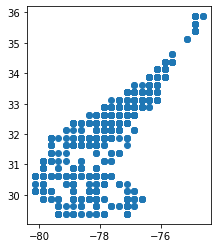

In [397]:
import geopandas as gpd
gdf = gpd.GeoDataFrame(
    df, geometry=gpd.points_from_xy(df.lon, df.lat))
gdf.plot()

In [398]:
gdf

,eddy_id,date,lat,lon,geometry
0,0,2017-01-01,30.375,-78.375,POINT (-78.37500 30.37500)
1,1,2017-01-02,29.375,-77.125,POINT (-77.12500 29.37500)
2,0,2017-01-02,30.625,-78.375,POINT (-78.37500 30.62500)
3,1,2017-01-03,29.375,-77.125,POINT (-77.12500 29.37500)
4,0,2017-01-03,30.625,-78.375,POINT (-78.37500 30.62500)
...,...,...,...,...,...
1280,147,2019-10-10,31.625,-78.125,POINT (-78.12500 31.62500)
1281,147,2019-10-11,31.625,-78.125,POINT (-78.12500 31.62500)
1282,147,2019-10-12,31.625,-78.125,POINT (-78.12500 31.62500)
1283,147,2019-10-13,31.625,-78.125,POINT (-78.12500 31.62500)


In [399]:
gdf.hvplot(global_extent=True, frame_height=450, tiles=True)

:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Points.I :Points   [Longitude,Latitude]

assuming I now have a list of eddies each with a lot of time,lat,lons I can zoom through the chl-a dataset and make some figs of what chl-a looks like at each step within a certain eddy

these could then easily be averaged to get some fields and I could get averages across a latitude as well as across time

In [157]:
ds = xr.open_mfdataset('oceancolour_occi/CCI_ALL-v5.0-DAILY*.nc')

In [167]:
row = next(gdf.iterrows())

In [172]:
row

(0,
 eddy_id                          0
 date           2019-05-04 00:00:00
 lat                         31.625
 lon                        -78.625
 geometry    POINT (-78.625 31.625)
 Name: 0, dtype: object)

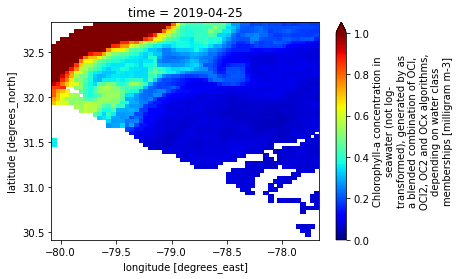

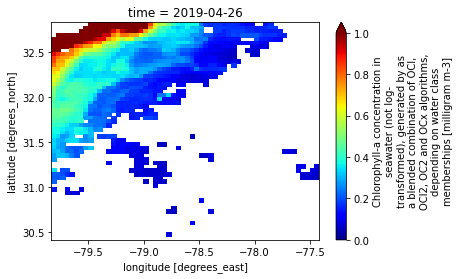

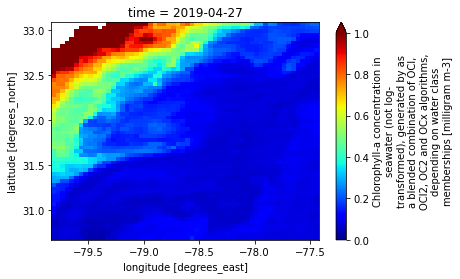

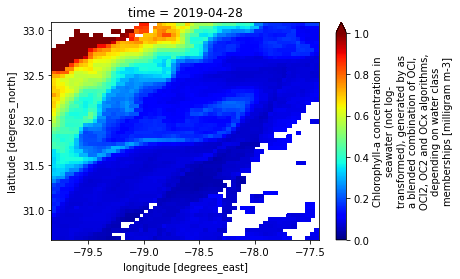

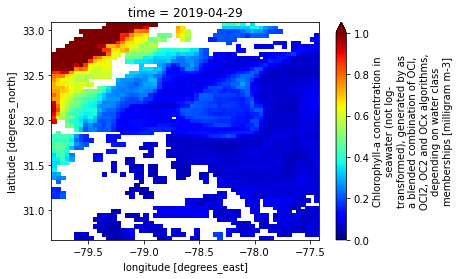

...

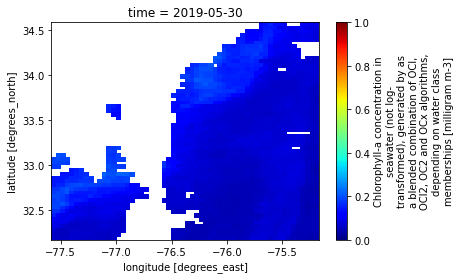

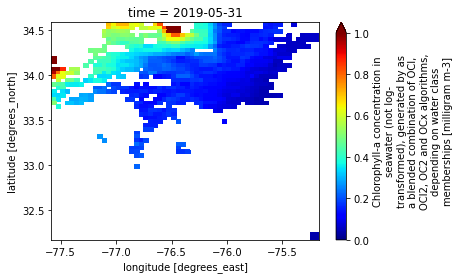

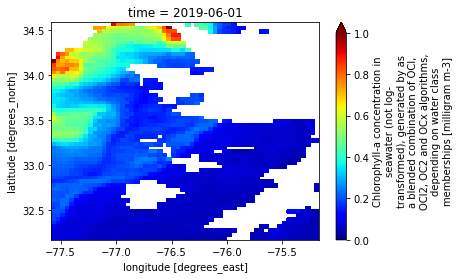

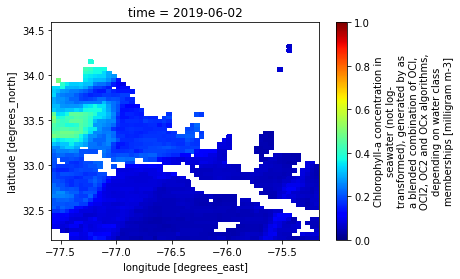

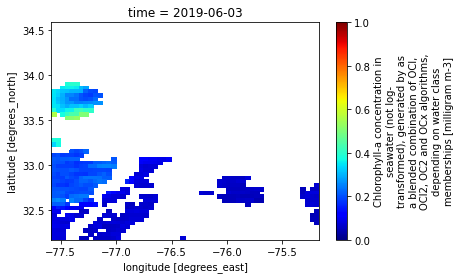

In [223]:
import matplotlib
for i, row in gdf[gdf.eddy_id == 16].iterrows():
    #print(row)
    ds.sel(time=row.date, 
           lat=slice(row.lat+1.2, 
                     row.lat-1.2), 
           lon=slice(row.lon-1.2, 
                     row.lon+1.2)).chlor_a.plot(vmin=0, vmax=1, cmap='jet')
            #norm=matplotlib.colors.LogNorm())
    plt.show()

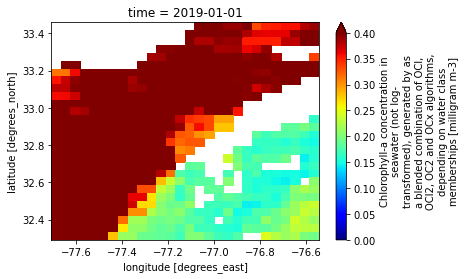

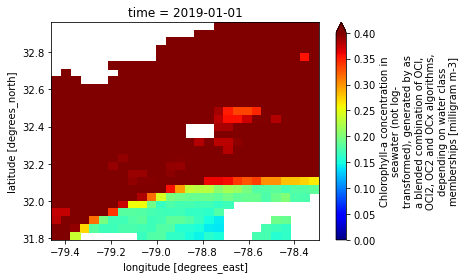

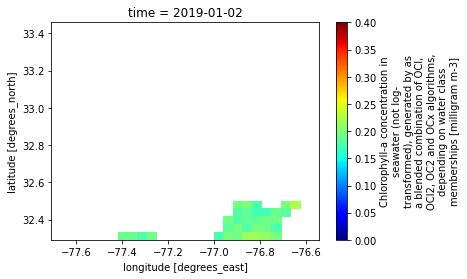

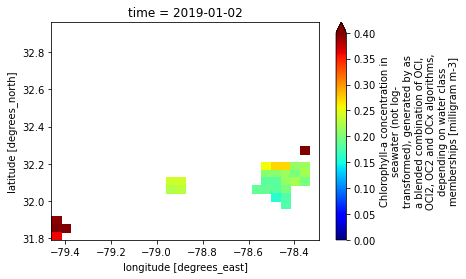

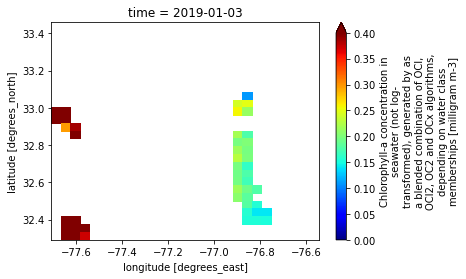

...

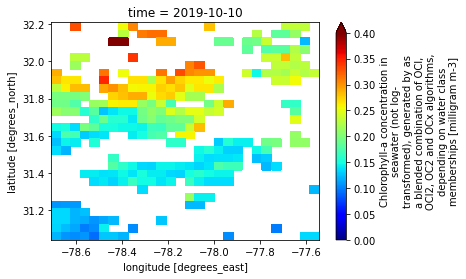

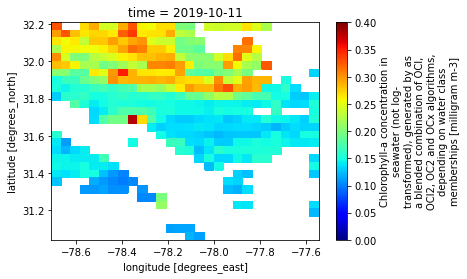

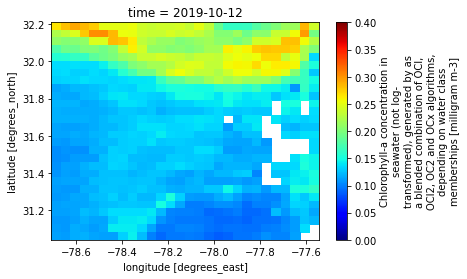

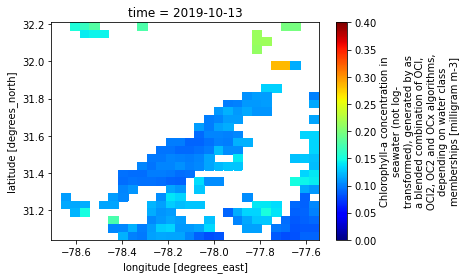

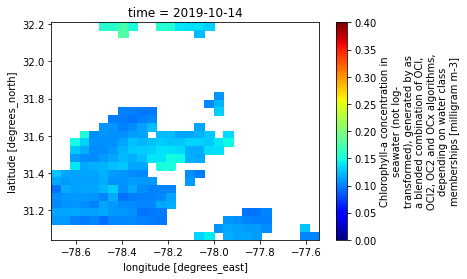

In [300]:
# let's try to make an average chl-a field at a couple different latitudes for a window around the point

# find all pts within a certain range
gdf_section = gdf[gdf['lat'].between(31.5, 33, inclusive=True)]

# for each time/point pair find the chla image that matches
buffer = 0.6
arrays = []
for i, row in gdf_section.iterrows():
    ds_subset = ds.sel(time=row.date, 
           lat=slice(row.lat+buffer, 
                     row.lat-buffer), 
           lon=slice(row.lon-buffer, 
                     row.lon+buffer))
    arrays.append(ds_subset.chlor_a.values)
            #norm=matplotlib.colors.LogNorm())
    ds_subset.chlor_a.plot(vmin=0, vmax=0.4, cmap='jet')
    plt.show()    

# visualize mean, median, std




In [292]:
chl_timeseries = np.array(arrays)
chl_timeseries[chl_timeseries > .4] = np.nan

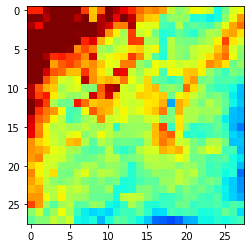

In [294]:
plt.imshow(np.nanstd(chl_timeseries,axis=0),clim=(0,0.1),cmap='jet')

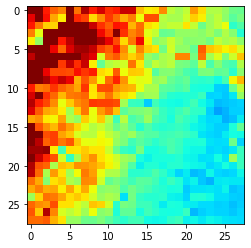

In [296]:
#plt.imshow(np.nanmean(np.array(arrays),axis=0))

plt.imshow(np.nanmedian(chl_timeseries,axis=0),clim=(0,0.2),cmap='jet')

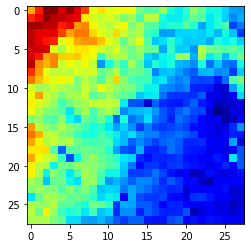

In [287]:
#plt.imshow(np.nanmean(np.array(arrays),axis=0))

plt.imshow(np.nanmedian(chl_timeseries,axis=0),norm=matplotlib.colors.LogNorm(),cmap='jet')

In [302]:
# make an animation of the sla and the concurrent paths

ds_ssh.sla

<xarray.DataArray 'sla' (time: 288, lat: 28, lon: 68)>
[548352 values with dtype=float64]
Coordinates:
  * time     (time) datetime64[ns] 2019-01-01 2019-01-02 ... 2019-10-15
  * lat      (lat) float32 29.125 29.375 29.625 29.875 ... 35.375 35.625 35.875
  * lon      (lon) float32 -81.875 -81.625 -81.375 ... -65.625 -65.375 -65.125
Attributes:
    comment:        The sea level anomaly is the sea surface height above mea...
    grid_mapping:   crs
    long_name:      Sea level anomaly
    standard_name:  sea_surface_height_above_sea_level
    units:          m
    _ChunkSizes:    [ 1 50 50]

<AxesSubplot:>

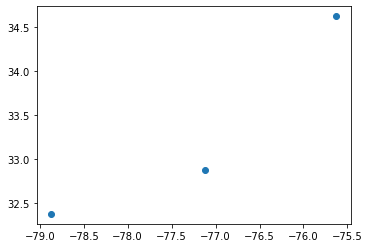

In [336]:
gdf[gdf.date==current_date].plot()

In [402]:
gdf_long_tracks = gdf.groupby('eddy_id').filter(lambda x: len(x) > 7)
gdf_long_tracks

,eddy_id,date,lat,lon,geometry
0,0,2017-01-01,30.375,-78.375,POINT (-78.37500 30.37500)
1,1,2017-01-02,29.375,-77.125,POINT (-77.12500 29.37500)
2,0,2017-01-02,30.625,-78.375,POINT (-78.37500 30.62500)
3,1,2017-01-03,29.375,-77.125,POINT (-77.12500 29.37500)
4,0,2017-01-03,30.625,-78.375,POINT (-78.37500 30.62500)
...,...,...,...,...,...
1280,147,2019-10-10,31.625,-78.125,POINT (-78.12500 31.62500)
1281,147,2019-10-11,31.625,-78.125,POINT (-78.12500 31.62500)
1282,147,2019-10-12,31.625,-78.125,POINT (-78.12500 31.62500)
1283,147,2019-10-13,31.625,-78.125,POINT (-78.12500 31.62500)


In [403]:
current_date = start
for i in range((end - start).days):
    fig,ax = plt.subplots(figsize=(10,7))
    ds_ssh.sla.sel(time=current_date).plot(ax=ax, vmin=-0.4,vmax=.4,cmap='bwr' )
    #ax.plot([281.5, 285.5], [31, 35], color='grey',linestyle='--')
    #for i, row in gdf[gdf.date==current_date].iterrows():
        #for each one that exists now, find all that match its eddy_id, then run through each pair and plot it
        #ax.scatter(row.lon, row.lat, color='black')
    gdf_long_tracks[gdf_long_tracks.date==current_date].plot(ax=ax, c='black')
    plt.savefig(f"tmp_imgs/eddy_anim_tracking_sla_long{i:04}.png")
    plt.close()
    current_date = current_date + timedelta(days=1)

/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/geopandas/plotting.py:607: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/geopandas/plotting.py:607: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/geopandas/plotting.py:607: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/geopandas/plotting.py:607: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,
/home/clifgray/anaconda3/envs/micasense/lib/python3.7/site-packages/geopandas/plotting.py:607: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been d

In [404]:
! convert -background white -alpha remove -layers OptimizePlus -delay 18x100 tmp_imgs/eddy_anim_tracking_sla_long*.png -loop 0 tmp_imgs/eddy_anim_tracking_sla_long.gif

In [ ]:
# make some plots of depth across time
# visualize all the tracks together